In [1]:
import math
from pathlib import Path
import sys
import numpy as np
import pandas as pd
from scipy import stats
import statistics

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns


from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans,DBSCAN
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

In [2]:
sys.path.append("mirpy/")
sys.path.append("../")
#import TCRemb_code2
#import TCRemb_code3
import tcremb.TCRemb as TCRemb
import tcremb.ml_utils as ml_utils
import tcremb.data_proc as data_proc
import benchmark.metrics as metrics

In [3]:
import warnings
warnings.filterwarnings('ignore')

# Paths

In [4]:
donor = 'donor1'
label = 'top_tetramer'
label_high = 'top_tetramer_freq'

## folders for results tcremb/<run_name>
run_name = '10x_' + donor
## paired pipeline better in other folder
run_name_paired = '10x_paired_' + donor

In [5]:
data_path = f'data/data_preped/10x_annot_data_{donor}.txt'
data_paired_path = f'data/data_preped/10x_annot_data_paired{donor}.txt'

In [6]:
outputs_path= "tcremb_outputs/" + run_name + '/'
Path(outputs_path).mkdir(parents=True, exist_ok=True)

In [7]:
#label_test = 'top_tetramer'
tcr_columns = ['cdr3aa','v','j','chain']
clonotype_id_column = 'cloneId'
#data_id= 'data_id'
annotation_id = 'annotId'
#pairing_id = 'barcode'
annotation_tcr_id_columns_dict = {'TRA': 'cloneId','TRB': 'cloneId','TRA_TRB': {'TRA':'cloneId_TRA', 'TRB':'cloneId_TRB'}}

# Load data

In [8]:
data_preped = pd.read_csv(data_path,sep='\t')


In [9]:
data_paired = pd.read_csv(data_paired_path,sep='\t')


## Data overview

In [10]:
label_freq_list = list(data_paired[label_high].drop_duplicates().sort_values())
custom_palette = ml_utils.make_custom_palette(label_freq_list)

<Axes: xlabel='Count', ylabel='top_tetramer'>

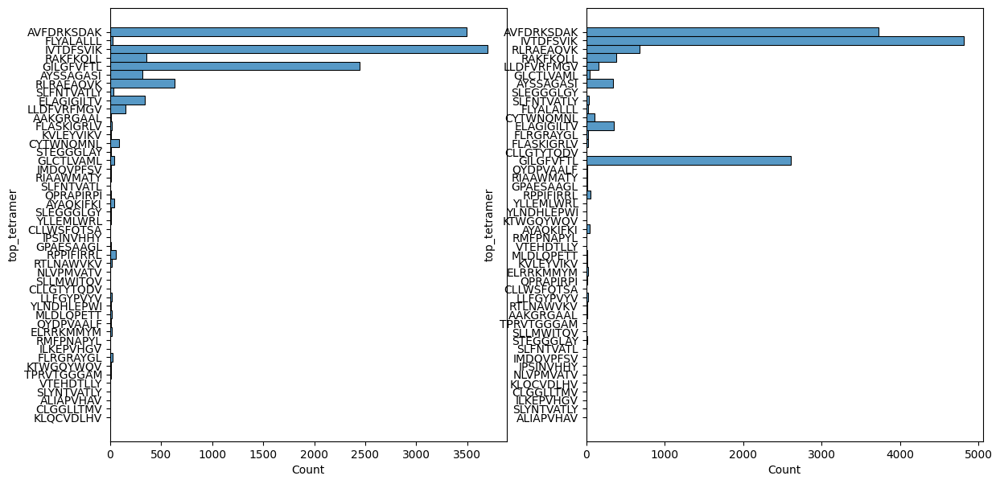

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
sns.histplot(y=data_preped[data_preped['chain']=='TRA'][label],  ax=axes[0])
sns.histplot(y=data_preped[data_preped['chain']=='TRB'][label],  ax=axes[1])

# TCR3mb

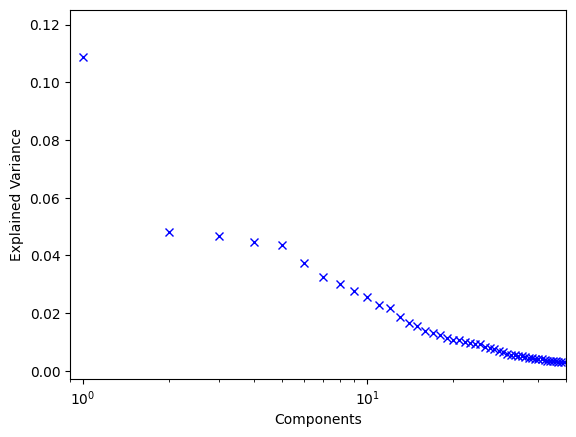

In [12]:
tcremb = TCRemb.TCRemb(run_name, data_paired) # init: input data saved, folder created
tcremb.tcremb_clonotypes('TRA') # clonotypes extraction
#tcremb.tcremb_dists_count('TRA') # dist scores count
tcremb.tcremb_dists('TRA') # dist scores extraction
tcremb.tcremb_pca('TRA')
tcremb.tcremb_tsne('TRA')

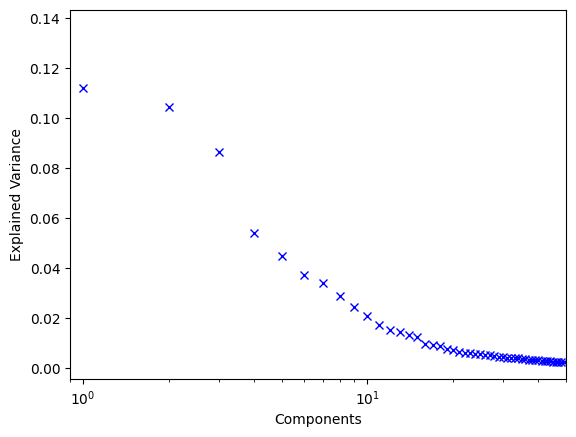

In [13]:
tcremb.tcremb_clonotypes('TRB')
#tcremb.tcremb_dists_count('TRB')
tcremb.tcremb_dists('TRB')
tcremb.tcremb_pca('TRB')
tcremb.tcremb_tsne('TRB')

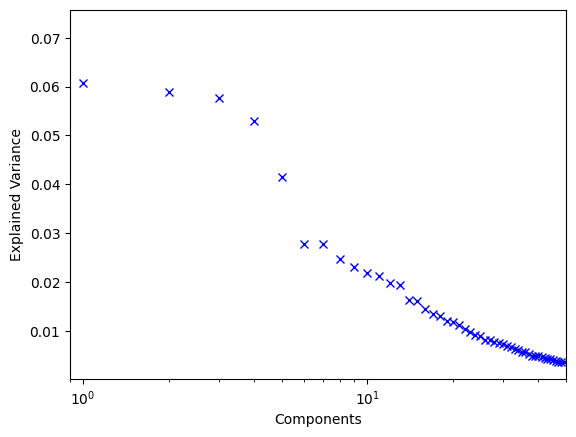

In [14]:
chain ='TRA_TRB'
tcremb.tcremb_clonotypes(chain)
#tcremb.tcremb_dists_count(chain)
tcremb.tcremb_dists(chain)
tcremb.tcremb_pca(chain)
tcremb.tcremb_tsne(chain)

# Check clonotypes in VDJdb

In [51]:
vdjdb_data_path = 'mirpy/notebooks/assets/vdjdb.slim.txt'

vdjdb_data = pd.read_csv(vdjdb_data_path,sep='\t')
vdjdb_data = vdjdb_data.rename({'gene':'chain','v.segm':'v','j.segm':'j'},axis=1)
vdjdb_data = data_proc.remove_asterisk(vdjdb_data, tcr_columns)


def epitope_in_vdjdb(vdjdb_data, v, j, cdr3aa):
    epis = list(vdjdb_data[(vdjdb_data['v']==v)&(vdjdb_data['j']==j)&(vdjdb_data['cdr3aa']==cdr3aa)]['antigen.epitope'])
    if len(epis)==1:
        return epis[0]
    elif len(epis)>1:
        return epis
    else:
        None
    


In [65]:
vdjdb_data.shape

(75280, 16)

In [52]:
data_preped_copy = data_preped.copy()

In [53]:
data_preped_copy['epitope_vdjdb']=data_preped_copy.apply(lambda x: epitope_in_vdjdb(vdjdb_data, x.v, x.j, x.cdr3aa) ,axis=1)

In [61]:
tra_all_n = len(data_preped_copy[(data_preped_copy['chain']=='TRA')])
print(f"TRA barcodes count:{tra_all_n}")
trb_all_n = len(data_preped_copy[(data_preped_copy['chain']=='TRB')])
print(f"TRB barcodes count:{trb_all_n}")

TRA barcodes count:12237
TRB barcodes count:13693


In [62]:
tra_in_vdjdb_n = len(data_preped_copy[(data_preped_copy['chain']=='TRA')&(-data_preped_copy['epitope_vdjdb'].isna())])
print(f"TRA barcodes with clonotypes found in VDJdb count:{tra_in_vdjdb_n}")
trb_in_vdjdb_n = len(data_preped_copy[(data_preped_copy['chain']=='TRB')&(-data_preped_copy['epitope_vdjdb'].isna())])
print(f"TRB barcodes with clonotypes found in VDJdb count:{trb_in_vdjdb_n}")

TRA barcodes with clonotypes foind in VDJdb count:8548
TRB barcodes with clonotypes foind in VDJdb count:11233


In [64]:
print(f"TRA known proportion:{tra_in_vdjdb_n/tra_all_n}")
print(f"TRB known proportion:{trb_in_vdjdb_n/trb_all_n}")

TRA known proportion:0.698537223175615
TRB known proportion:0.8203461622726941


# Analysis

In [36]:
custom_palette = ml_utils.make_custom_palette(label_freq_list)

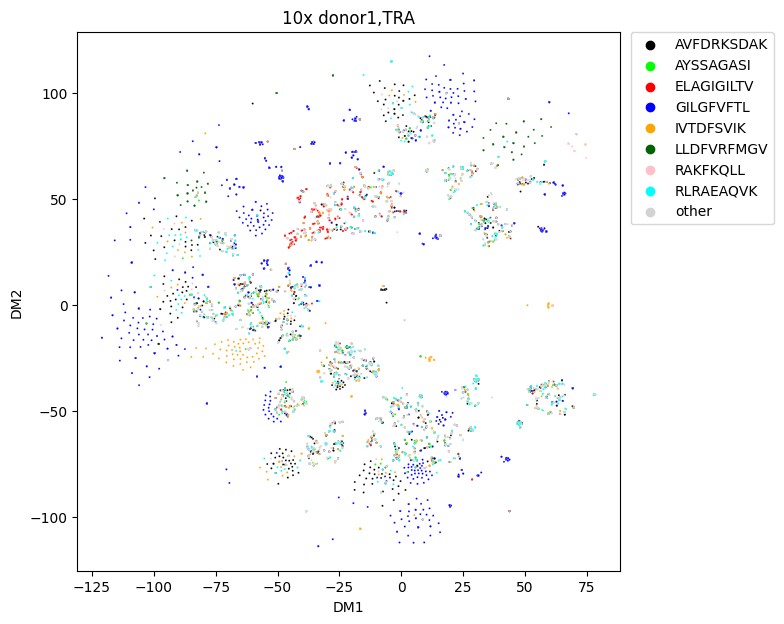

In [37]:
chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],tcremb.annot[chain]), label_high, f'10x {donor},{chain}', suptitle =  f'TSNE colored by {label_high}', custom_palette = custom_palette)

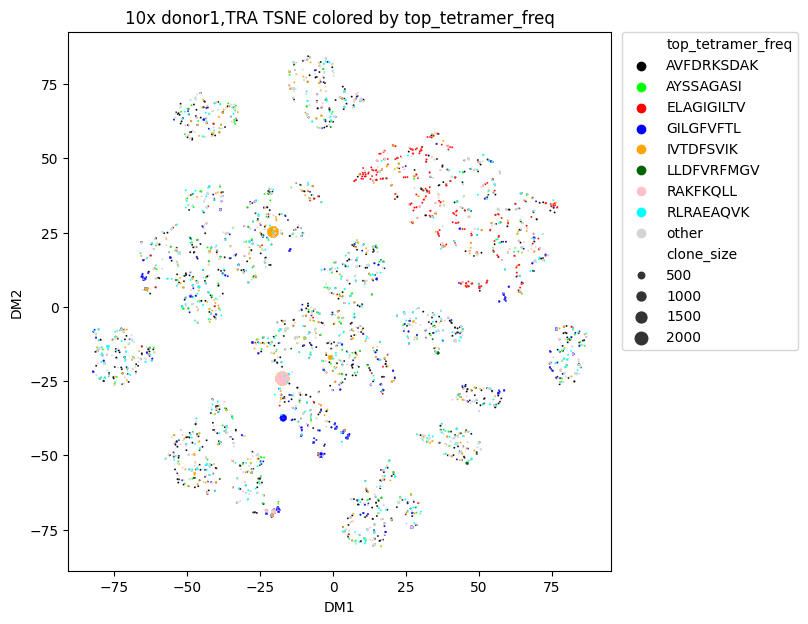

In [38]:
chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tcremb.tsne_clones[chain],tcremb.annot[chain]), label_high,  f'10x {donor},{chain} TSNE colored by {label_high}', to_size = 'clone_size',custom_palette = custom_palette)

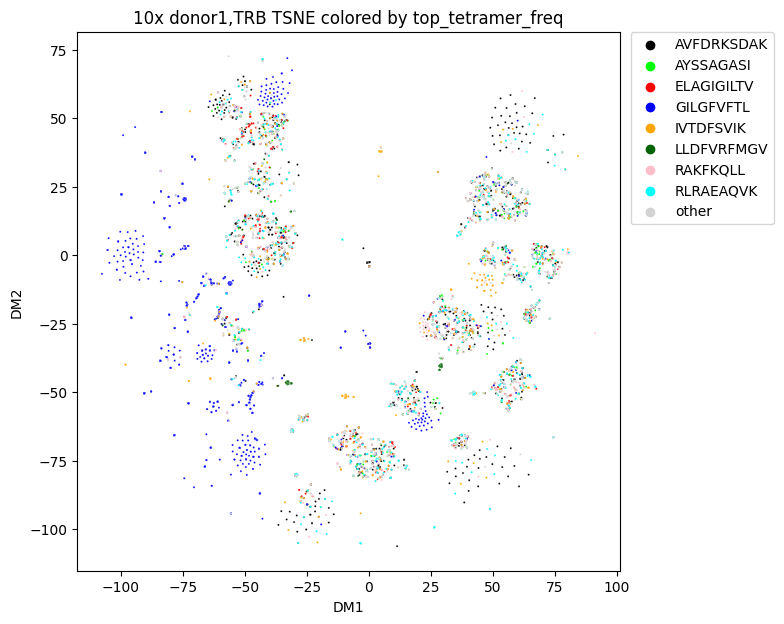

In [39]:
chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],tcremb.annot[chain]), label_high,  f'10x {donor},{chain} TSNE colored by {label_high}',custom_palette = custom_palette)

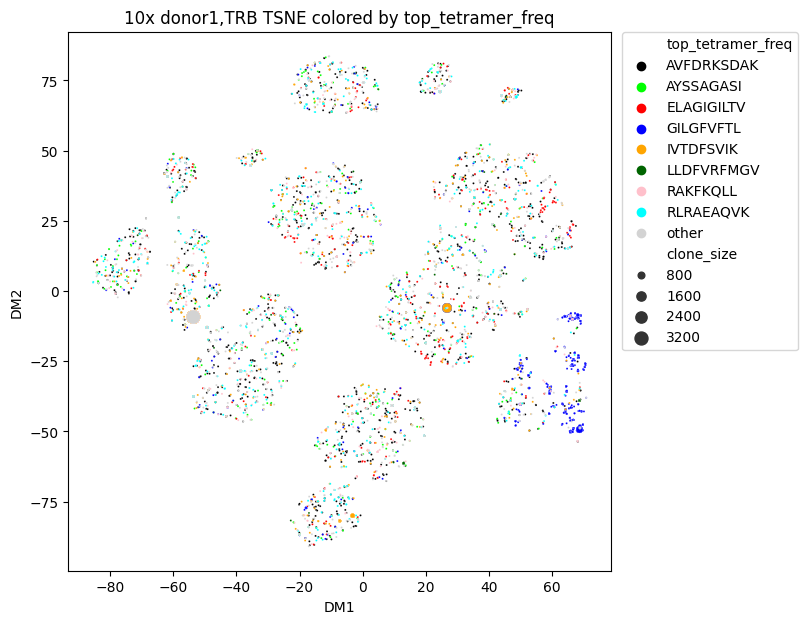

In [40]:
chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tcremb.tsne_clones[chain],tcremb.annot[chain]), label_high,  f'10x {donor},{chain} TSNE colored by {label_high}', to_size = 'clone_size',custom_palette = custom_palette)

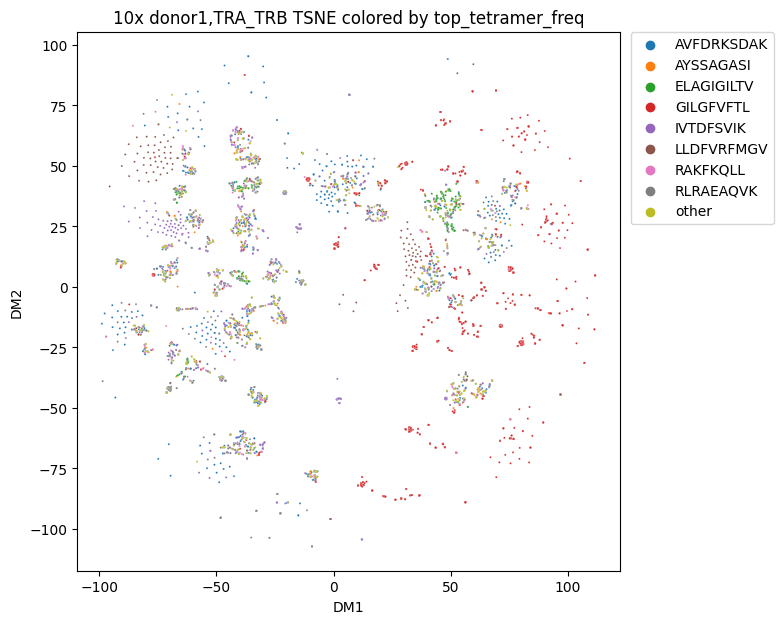

In [41]:
chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],tcremb.annot[chain]), label_high,  f'10x {donor},{chain} TSNE colored by {label_high}')

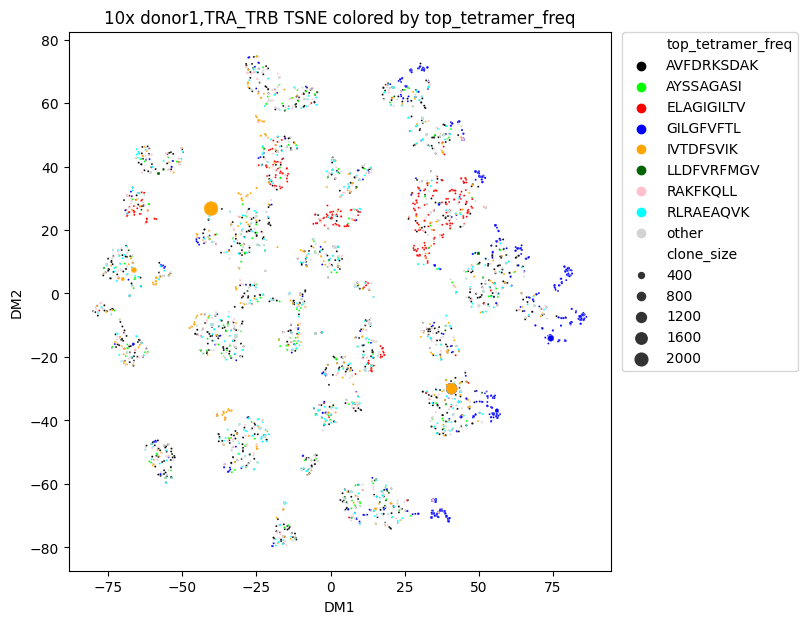

In [42]:
chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tcremb.tsne_clones[chain],tcremb.annot[chain]), label_high,  f'10x {donor},{chain} TSNE colored by {label_high}', to_size = 'clone_size',custom_palette = custom_palette)


## Clustering

### dbscan

In [15]:
dbscan = TCRemb.TCRemb_clustering('DBSCAN')
metrics_dbscan = {}

In [16]:
chain='TRA'

model = DBSCAN(eps=750, min_samples=2)
dbscan.clstr(chain,tcremb, label, model=model)

purity:0.9704541617423603


In [17]:
df = tcremb.annot[chain].merge(dbscan.clstr_labels[chain])
metrics_dbscan[chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[chain]['total pairs TCR-epitope'] = len(tcremb.annot[chain])
metrics_dbscan[chain]['total unique TCRs'] = str(len(tcremb.annot[chain].drop_duplicates(tcremb.clonotype_id)))
metrics_dbscan[chain]['total unique epitopes'] = str(len(tcremb.annot[chain].drop_duplicates(label)))
metrics_dbscan[chain]


{'purity': 0.9704541617423603,
 'retention': 0.5033140720598233,
 'consistency': 0.03242275873712645,
 'ami': 0.8873774463497747,
 'accuracy': 0.0001688048567682809,
 'precision': 0.9700336820655939,
 'recall': 0.9704541617423603,
 'f1-score': 0.9702438763476087,
 'support': 5923,
 'mean_clustsize': 49.773109243697476,
 'total pairs TCR-epitope': 11768,
 'total unique TCRs': '3417',
 'total unique epitopes': '46'}

In [18]:
chain='TRB'

model = DBSCAN(eps=750, min_samples=2)
dbscan.clstr(chain,tcremb, label, model=model)

purity:0.9923650876279715


In [19]:
df = tcremb.annot[chain].merge(dbscan.clstr_labels[chain])
metrics_dbscan[chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[chain]['total pairs TCR-epitope'] = len(tcremb.annot[chain])
metrics_dbscan[chain]['total unique TCRs'] = str(len(tcremb.annot[chain].drop_duplicates(tcremb.clonotype_id)))
metrics_dbscan[chain]['total unique epitopes'] = str(len(tcremb.annot[chain].drop_duplicates(label)))
metrics_dbscan[chain]


{'purity': 0.9923650876279715,
 'retention': 0.4236876929863255,
 'consistency': 0.08832205448551103,
 'ami': 0.951354719618537,
 'accuracy': 0.00017349062628219193,
 'precision': 0.9922969476026473,
 'recall': 0.9923650876279714,
 'f1-score': 0.9923310164455729,
 'support': 5763,
 'mean_clustsize': 230.52,
 'total pairs TCR-epitope': 13602,
 'total unique TCRs': '3649',
 'total unique epitopes': '46'}

In [20]:
chain='TRA_TRB'

model = DBSCAN(eps=750, min_samples=2)
dbscan.clstr(chain,tcremb, label, model=model)

purity:0.988597189074516


In [21]:
df = tcremb.annot[chain].merge(dbscan.clstr_labels[chain])
metrics_dbscan[chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[chain]['total pairs TCR-epitope'] = len(tcremb.annot[chain])
metrics_dbscan[chain]['total unique TCRs'] = str(len(tcremb.annot[chain].drop_duplicates(tcremb.clonotype_id)))
metrics_dbscan[chain]['total unique epitopes'] = str(len(tcremb.annot[chain].drop_duplicates(label)))
metrics_dbscan[chain]


{'purity': 0.988597189074516,
 'retention': 0.346535563315567,
 'consistency': 0.08175550251922568,
 'ami': 0.9525098600322497,
 'accuracy': 0.0002651113281226651,
 'precision': 0.9894928025234712,
 'recall': 0.9885971890745162,
 'f1-score': 0.989044793046982,
 'support': 3771,
 'mean_clustsize': 139.66666666666666,
 'total pairs TCR-epitope': 10882,
 'total unique TCRs': '3268',
 'total unique epitopes': '46'}

In [22]:
metrcs_res = pd.DataFrame(metrics_dbscan)
metrcs_res.drop('support')

,TRA,TRB,TRA_TRB
purity,0.970454,0.992365,0.988597
retention,0.503314,0.423688,0.346536
consistency,0.032423,0.088322,0.081756
ami,0.887377,0.951355,0.95251
accuracy,0.000169,0.000173,0.000265
precision,0.970034,0.992297,0.989493
recall,0.970454,0.992365,0.988597
f1-score,0.970244,0.992331,0.989045
mean_clustsize,49.773109,230.52,139.666667
total pairs TCR-epitope,11768,13602,10882


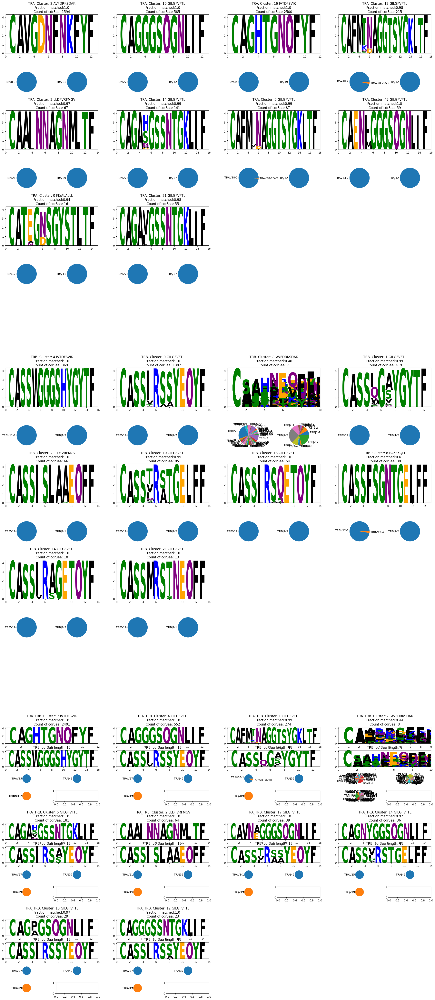

In [23]:
fig = plt.figure(figsize=(28,6*9))
subfigs = fig.subfigures(3, 1)
dbscan.clstrs_motif(tcremb,'TRA', 10, subfigs[0])
dbscan.clstrs_motif(tcremb, 'TRB', 10, subfigs[1])
dbscan.clstrs_motif(tcremb, 'TRA_TRB', 10, subfigs[2])


### Kmeans

In [30]:
kmeans = TCRemb.TCRemb_clustering('KMeans')

In [31]:
chain='TRA'
n_clusters = 2537
random_state = 8
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
kmeans.clstr(chain,tcremb, label,model)

mean fraction_mached only clusters: 0.6394950361692117
median fraction_mached only clusters: 0.5
purity:0.8580847723704866


In [32]:
chain='TRB'
n_clusters = 3026
random_state = 8
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
kmeans.clstr(chain,tcremb, label,model)

mean fraction_mached only clusters: 0.6466062732165645
median fraction_mached only clusters: 0.5
purity:0.8947832994968664


In [33]:
chain='TRA_TRB'
n_clusters = 3026
random_state = 8
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
kmeans.clstr(chain,tcremb_paired, label,model)

mean fraction_mached only clusters: 0.7151806825621065
median fraction_mached only clusters: 0.6666666666666666
purity:0.8918950167649439


Text(0.5, 1.0, 'count of tcrs in enriched clusters')

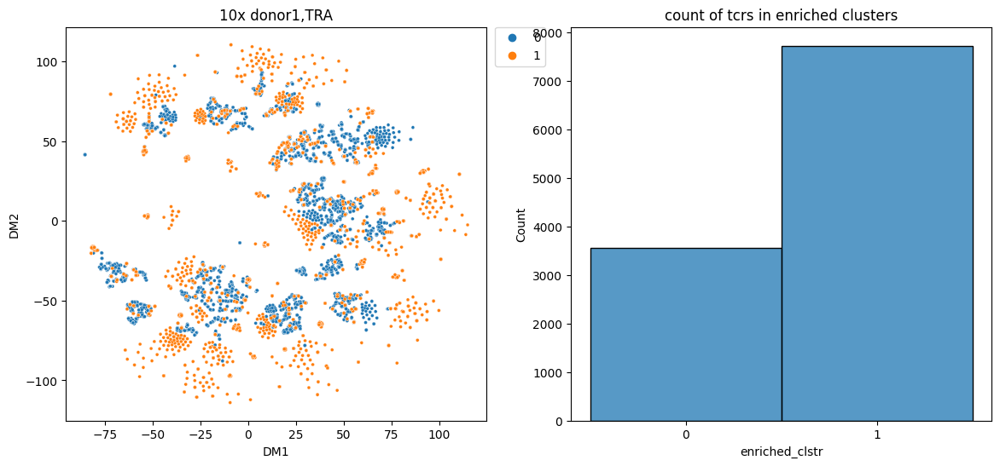

In [34]:
chain = 'TRA'
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(14, 6))
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],kmeans.clstr_labels[chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', ax=axes[0])

sns.histplot(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), ax = axes[1])
axes[1].set_title('count of tcrs in enriched clusters')

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

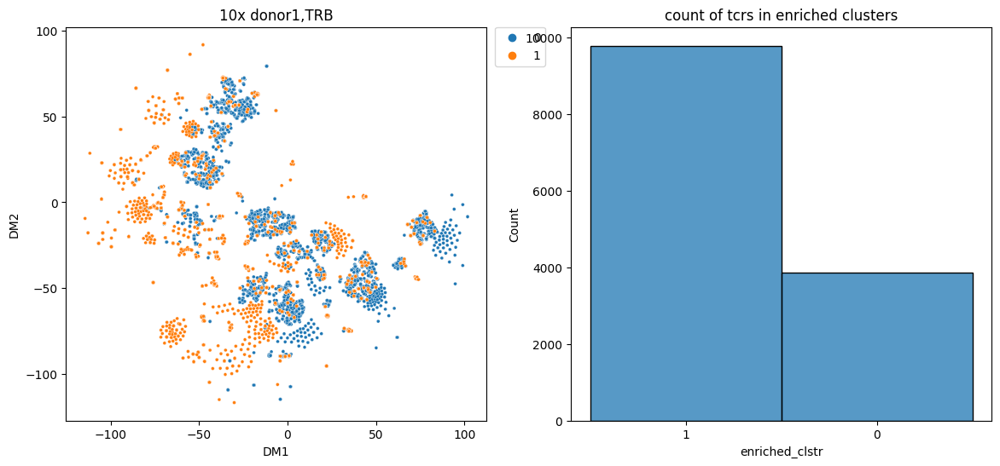

In [35]:
chain = 'TRB'
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(14, 6))
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],kmeans.clstr_labels[chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', ax=axes[0])

sns.histplot(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), ax = axes[1])
axes[1].set_title('count of tcrs in enriched clusters')

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

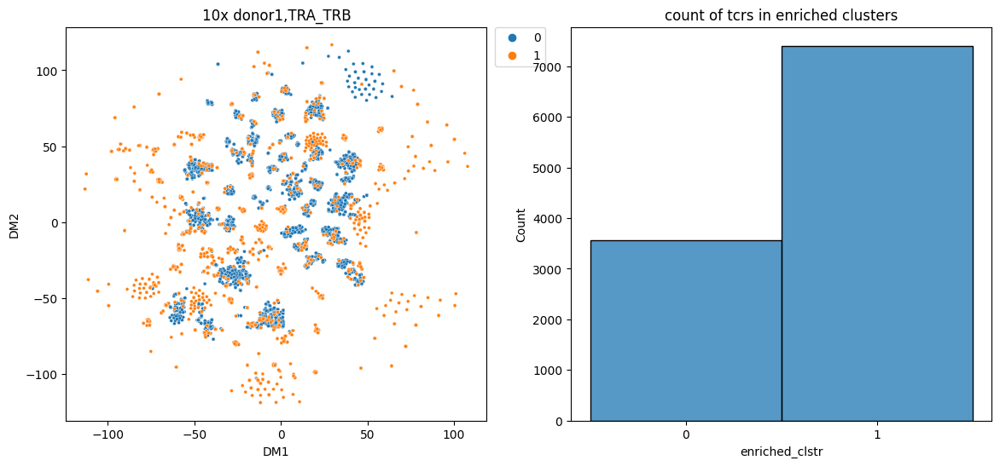

In [36]:
chain = 'TRA_TRB'
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(14, 6))
ml_utils.tsne_plot(pd.merge(tcremb_paired.tsne[chain],kmeans.clstr_labels[chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', ax=axes[0])

sns.histplot(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), ax = axes[1])
axes[1].set_title('count of tcrs in enriched clusters')

In [1]:
kmeans.clstr_labels[chain]['enriched_clstr']

NameError: name 'kmeans' is not defined

In [ ]:
chain = 'TRA_TRB'
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(14, 6))
ml_utils.tsne_plot(pd.merge(tcremb_paired.tsne[chain],kmeans.clstr_labels[chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', ax=axes[0])

sns.histplot(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), ax = axes[1])
sizes = 
axes[1].pie(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), labels=)
axes[1].set_title('count of tcrs in enriched clusters')


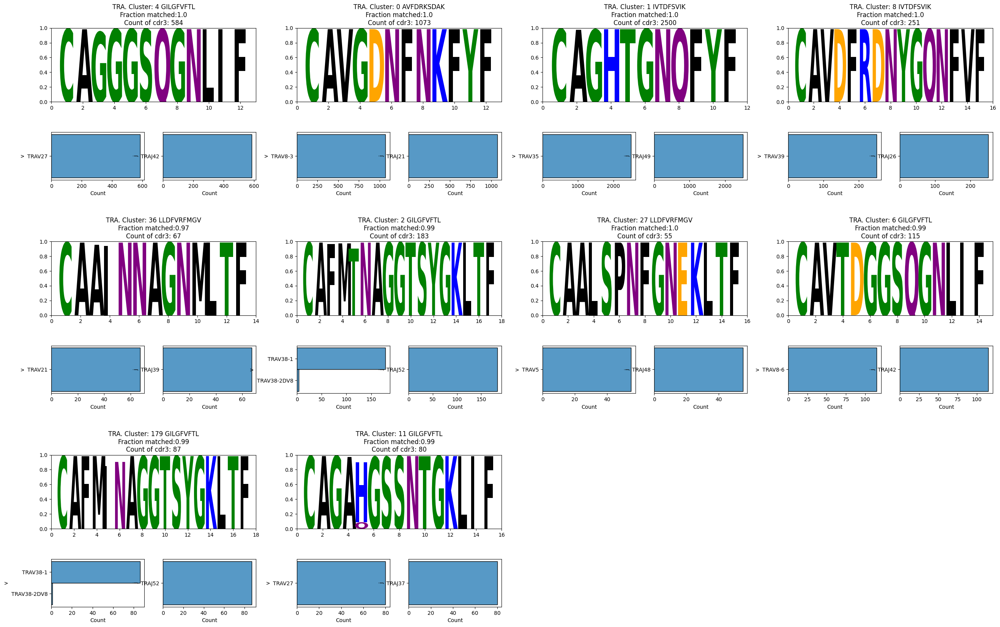

In [34]:
chain = 'TRA'
kmeans.clstrs_motif(tcremb, chain, 10)

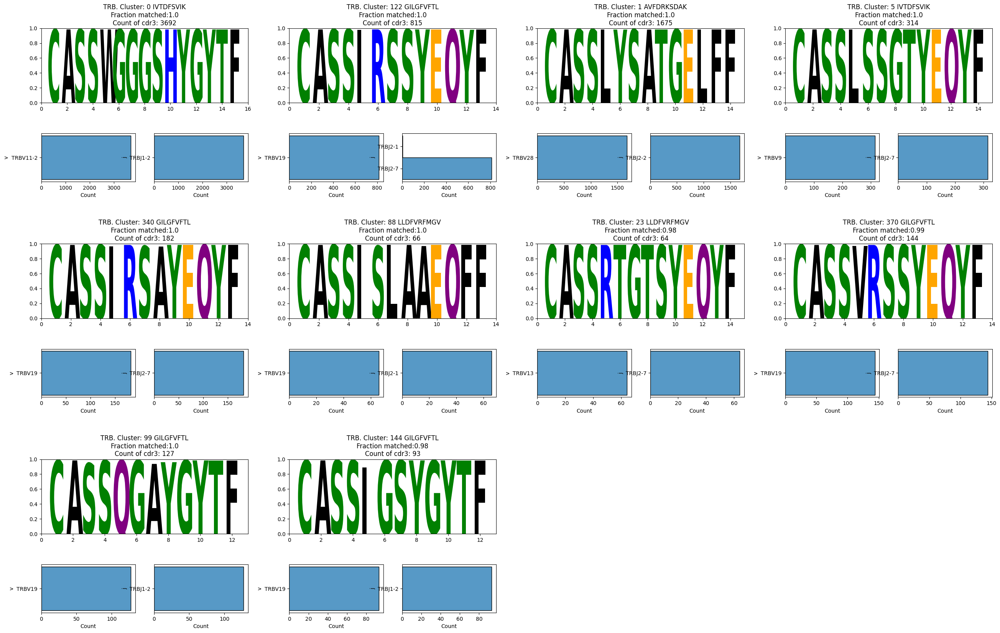

In [35]:
chain = 'TRB'
kmeans.clstrs_motif(tcremb, chain, 10)

In [53]:
kmeans.clstr_labels['TRA']

,cluster,annotId,label_cluster,total_cluster,total_group,count_mached,fraction_mached,fraction_mached_exp,p_value,is_cluster,enriched_clstr
0,1818,0,AVFDRKSDAK,1,2962,1,1.000000,0.262705,2.627051e-01,0,0
1,1328,1,AVFDRKSDAK,2,2962,2,1.000000,0.262705,6.901397e-02,1,1
2,49,2,AVFDRKSDAK,42,2962,31,0.738095,0.262705,1.717363e-10,1,1
3,20,3,AVFDRKSDAK,110,2962,59,0.536364,0.262705,1.048366e-09,1,0
4,1512,4,AVFDRKSDAK,1,2962,1,1.000000,0.262705,2.627051e-01,0,0
...,...,...,...,...,...,...,...,...,...,...,...
11270,1,12232,IVTDFSVIK,2500,3548,2498,0.999200,0.314678,0.000000e+00,1,1
11271,1,12233,IVTDFSVIK,2500,3548,2498,0.999200,0.314678,0.000000e+00,1,1
11272,1331,12234,IVTDFSVIK,2,3548,1,0.500000,0.314678,5.303344e-01,1,0
11273,1,12235,IVTDFSVIK,2500,3548,2498,0.999200,0.314678,0.000000e+00,1,1


KeyError: 'fraction_mached'

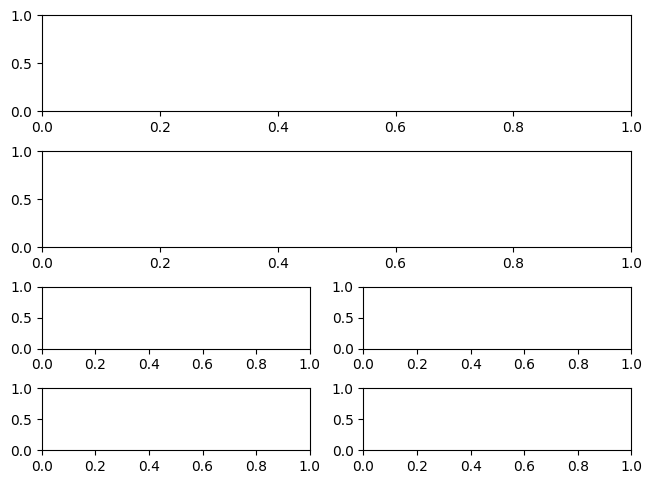

In [36]:
chain = 'TRA_TRB'
kmeans.clstrs_motif(tcremb_paired, chain, 10)

In [114]:
model_name = 'KMeans_label_high'
threshold = 0.75
clstr_dict[model_name]= {'binom_res':{},'clstr_metrics':{}}
tcremb['clstr_labels'][model_name]={}

In [115]:
chain = 'TRA'
label_cl = label_high
n_clusters = 2244
random_state = 8

y_data = tcremb['annot'][chain][label_cl]
X_data = tcremb['pca'][chain]

## fit
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
tcremb['clstr_labels'][model_name][chain] = TCRemb_code2.clstr_model(model, X_data , annotation_id)

## evaluation
clstr_dict[model_name]['binom_res'][chain] = TCRemb_code2.binominal_test(pd.merge(tcremb['clstr_labels'][model_name][chain],tcremb['annot'][chain]), 'cluster', label_cl)

clstr_dict[model_name]['binom_res'][chain]['enriched_clstr'] =clstr_dict[model_name]['binom_res'][chain].apply(lambda x:1 
                                                                                                               if (x.fraction_matched>=threshold)
                                                                                                               and (x.total_cluster>2) else 0,axis=1)
clstr_dict[model_name]['clstr_metrics'][chain] = TCRemb_code2.clstr_metrics(tcremb['annot'][chain][label_cl],tcremb['clstr_labels'][model_name][chain]['cluster'])

tcremb['clstr_labels'][model_name][chain] = tcremb['clstr_labels'][model_name][chain].merge(clstr_dict[model_name]['binom_res'][chain].rename({label_cl:str('clstr_' + label_cl)},axis=1)
                                                                                            , on='cluster').sort_values(annotation_id).reset_index(drop=True)

In [116]:
print('mean fraction_matched: ' + str(statistics.mean(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
print('median fraction_matched: ' + str(statistics.median(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
clstr_dict[model_name]['clstr_metrics'][chain]

mean fraction_mached: 0.9185752577767673
median fraction_mached: 1.0


{'homogeneity_score': 0.8696875279518915,
 'completeness_score': 0.23551001865701462,
 'v_measure_score': 0.3706488972259765,
 'adjusted_rand_score': 0.16459490731373635,
 'adjusted_mutual_info_score': 0.3451237807551854}

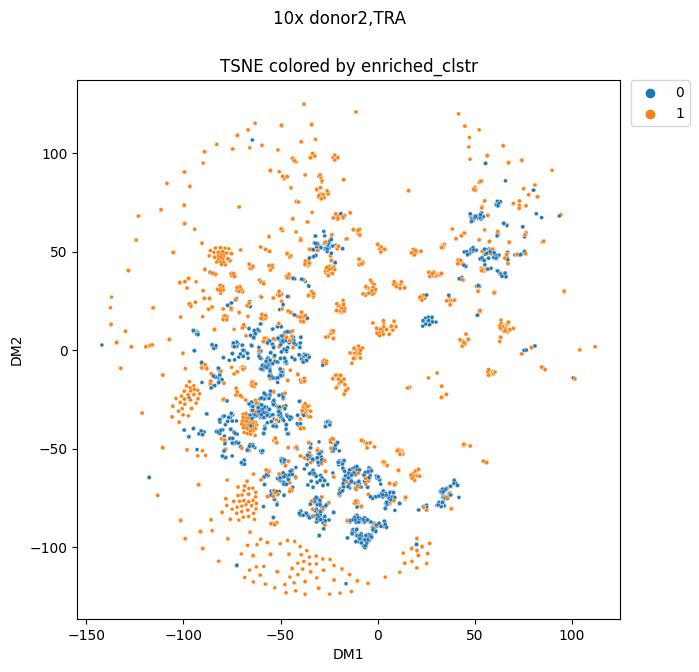

In [117]:
chain = 'TRA'
TCRemb_code2.tsne_plot(pd.merge(tcremb['tsne'][chain],tcremb['clstr_labels'][model_name][chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', True)

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

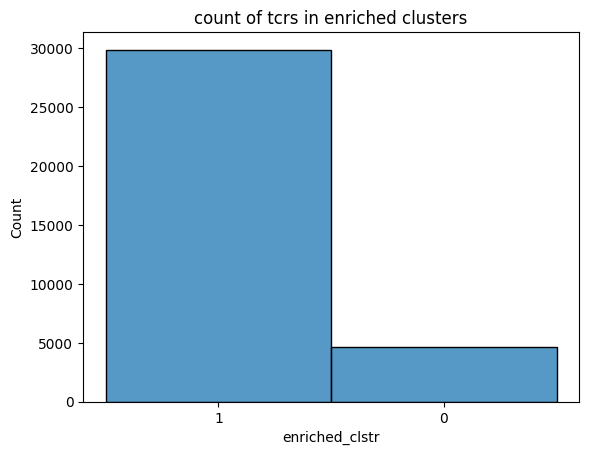

In [118]:
sns.histplot(tcremb['clstr_labels'][model_name][chain]['enriched_clstr'].astype(str))
plt.title('count of tcrs in enriched clusters')

In [119]:
chain = 'TRB'
label_cl = label_high
n_clusters = 2672
random_state = 8

y_data = tcremb['annot'][chain][label_cl]
X_data = tcremb['pca'][chain]

## fit
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
tcremb['clstr_labels'][model_name][chain] = TCRemb_code2.clstr_model(model, X_data , annotation_id)

## evaluation
clstr_dict[model_name]['binom_res'][chain] = TCRemb_code2.binominal_test(pd.merge(tcremb['clstr_labels'][model_name][chain],tcremb['annot'][chain]), 'cluster', label_cl)
clstr_dict[model_name]['binom_res'][chain]['enriched_clstr_1'] =clstr_dict[model_name]['binom_res'][chain].apply(lambda x:1 
                                                                                                               if (x.fraction_matched>=threshold)
                                                                                                               and (x.total_cluster>2) else 0,axis=1)
clstr_dict[model_name]['binom_res'][chain]['enriched_clstr'] =clstr_dict[model_name]['binom_res'][chain].apply(lambda x:1 
                                                                                                               if (x.fraction_matched>=0.9)
                                                                                                               and (x.total_cluster>2) else 0,axis=1)
clstr_dict[model_name]['clstr_metrics'][chain] = TCRemb_code2.clstr_metrics(tcremb['annot'][chain][label_cl],tcremb['clstr_labels'][model_name][chain]['cluster'])

tcremb['clstr_labels'][model_name][chain] = tcremb['clstr_labels'][model_name][chain].merge(clstr_dict[model_name]['binom_res'][chain].rename({label_cl:str('clstr_' + label_cl)},axis=1)
                                                                                            , on='cluster').sort_values(annotation_id).reset_index(drop=True)

In [120]:
print('mean fraction_matched: ' + str(statistics.mean(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
print('median fraction_matched: ' + str(statistics.median(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
clstr_dict[model_name]['clstr_metrics'][chain]

mean fraction_mached: 0.9261850234465085
median fraction_mached: 1.0


{'homogeneity_score': 0.8731714685973871,
 'completeness_score': 0.23474075836476288,
 'v_measure_score': 0.3700093341925485,
 'adjusted_rand_score': 0.14224737325266054,
 'adjusted_mutual_info_score': 0.3447833174676751}

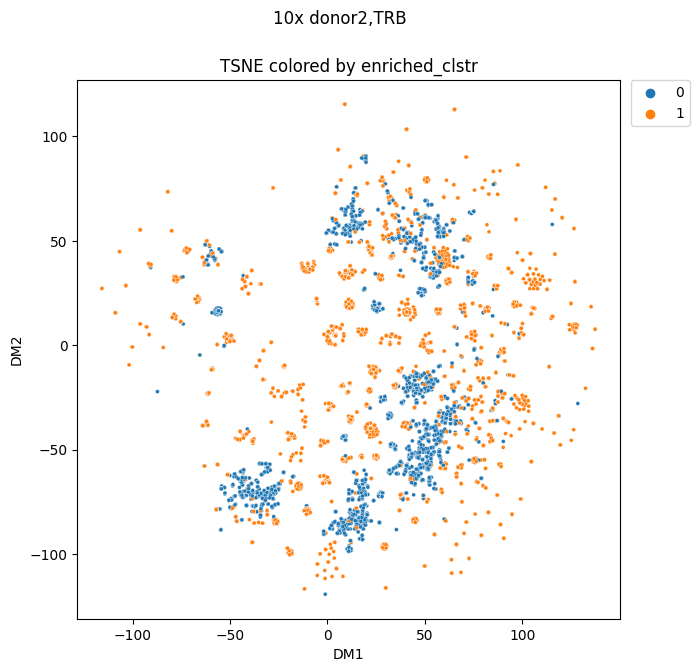

In [121]:
chain = 'TRB'
TCRemb_code2.tsne_plot(pd.merge(tcremb['tsne'][chain],tcremb['clstr_labels'][model_name][chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', True)

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

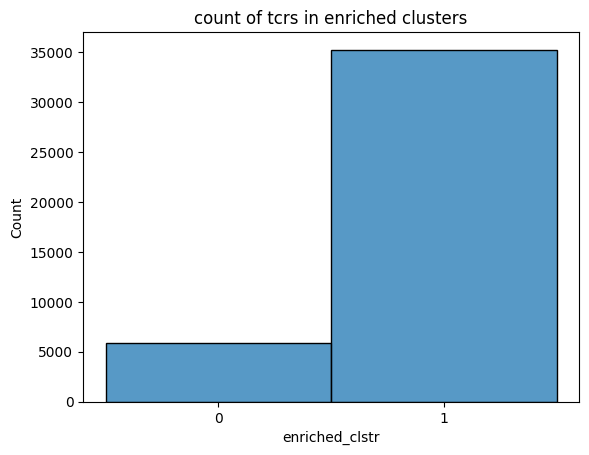

In [122]:
sns.histplot(tcremb['clstr_labels'][model_name][chain]['enriched_clstr'].astype(str))
plt.title('count of tcrs in enriched clusters')

In [123]:
chain = 'TRA_TRB'
label_cl = label_high
n_clusters = 2672
random_state = 8

y_data = tcremb['annot'][chain][label_cl]
X_data = tcremb['pca'][chain]

## fit
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
tcremb['clstr_labels'][model_name][chain] = TCRemb_code2.clstr_model(model, X_data , annotation_id)

## evaluation
clstr_dict[model_name]['binom_res'][chain] = TCRemb_code2.binominal_test(pd.merge(tcremb['clstr_labels'][model_name][chain],tcremb['annot'][chain]), 'cluster', label_cl)
clstr_dict[model_name]['binom_res'][chain]['enriched_clstr'] =clstr_dict[model_name]['binom_res'][chain].apply(lambda x:1 
                                                                                                               if (x.fraction_matched>=threshold)
                                                                                                               and (x.total_cluster>2) else 0,axis=1)
clstr_dict[model_name]['clstr_metrics'][chain] = TCRemb_code2.clstr_metrics(tcremb['annot'][chain][label_cl],tcremb['clstr_labels'][model_name][chain]['cluster'])

tcremb['clstr_labels'][model_name][chain] = tcremb['clstr_labels'][model_name][chain].merge(clstr_dict[model_name]['binom_res'][chain].rename({label_cl:str('clstr_' + label_cl)},axis=1)
                                                                                            , on='cluster').sort_values(annotation_id).reset_index(drop=True)

In [124]:
print('mean fraction_matched: ' + str(statistics.mean(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
print('median fraction_matched: ' + str(statistics.median(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
clstr_dict[model_name]['clstr_metrics'][chain]

mean fraction_mached: 0.9247156934741245
median fraction_mached: 1.0


{'homogeneity_score': 0.9028186705136068,
 'completeness_score': 0.22230646008163707,
 'v_measure_score': 0.3567646251600634,
 'adjusted_rand_score': 0.132134943198575,
 'adjusted_mutual_info_score': 0.3256599309096361}

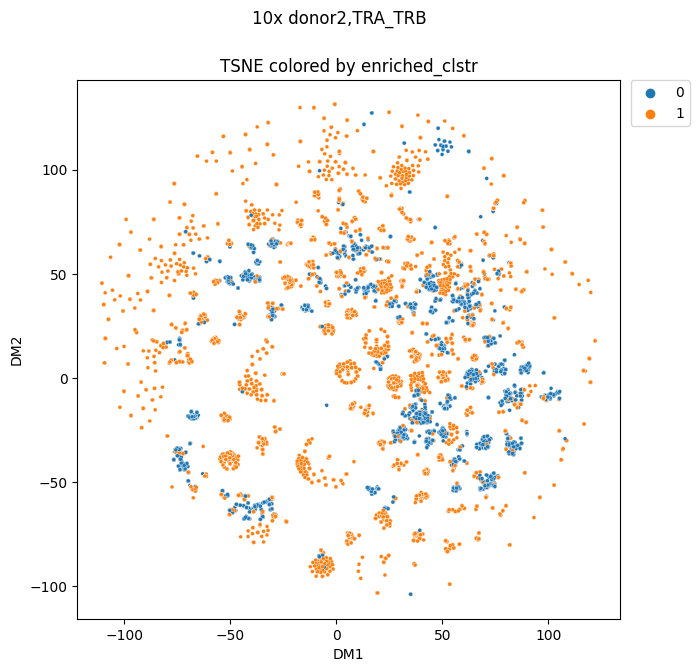

In [125]:
chain = 'TRA_TRB'
TCRemb_code2.tsne_plot(pd.merge(tcremb['tsne'][chain],tcremb['clstr_labels'][model_name][chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', True)

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

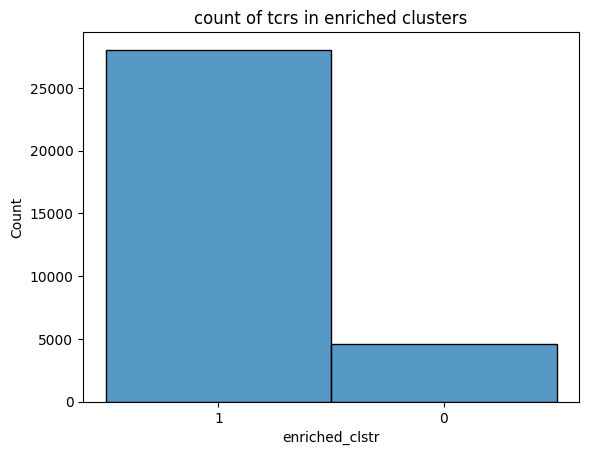

In [126]:
sns.histplot(tcremb['clstr_labels'][model_name][chain]['enriched_clstr'].astype(str))
plt.title('count of tcrs in enriched clusters')

## Classification

### RF

In [40]:
clf = TCRemb.TCRemb_clf('RF')
chain='TRA'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf.clf(chain,tcremb, label,test_size=0.15)

Train accuracy: 0.9278931441093603
Test accuracy: 0.7387706855791962
macro: {'f1': 0.15906794895702414, 'precision': 0.15723257251518857, 'recall': 0.16933666061905434}
weighted: {'f1': 0.7732776112563903, 'precision': 0.8417062416746448, 'recall': 0.7387706855791962}


In [41]:
chain='TRB'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf.clf(chain,tcremb, label,test_size=0.15)

Train accuracy: 0.9423275862068966
Test accuracy: 0.7685546875
macro: {'f1': 0.18631429216334222, 'precision': 0.1810651568942303, 'recall': 0.22284514668437183}
weighted: {'f1': 0.8074023431549842, 'precision': 0.9051994475900097, 'recall': 0.7685546875}


In [42]:
chain='TRA_TRB'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf.clf(chain,tcremb_paired, label,test_size=0.15)

Train accuracy: 0.9455052563827505
Test accuracy: 0.7430133657351154
macro: {'f1': 0.16886309541285816, 'precision': 0.1646080327893664, 'recall': 0.18720579015777566}
weighted: {'f1': 0.7793344171991385, 'precision': 0.8570554752463752, 'recall': 0.7430133657351154}


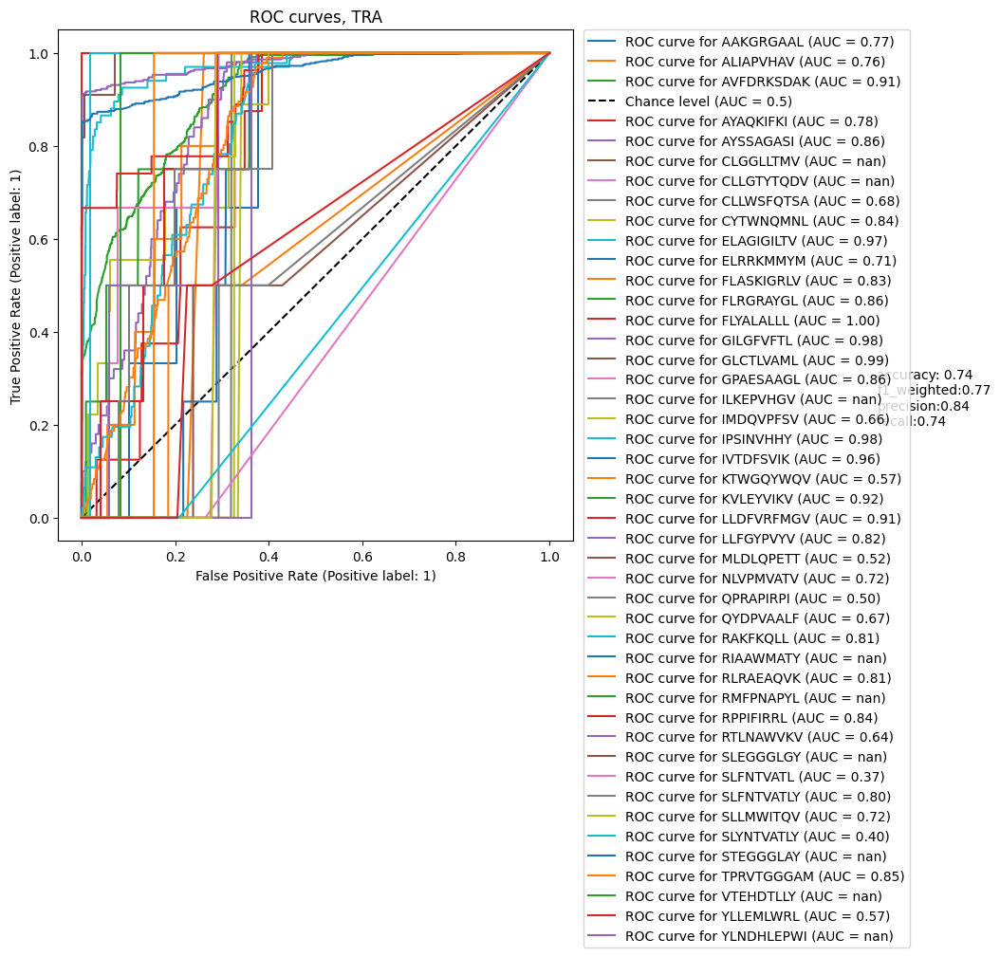

In [43]:
clf.roc_auc('TRA')

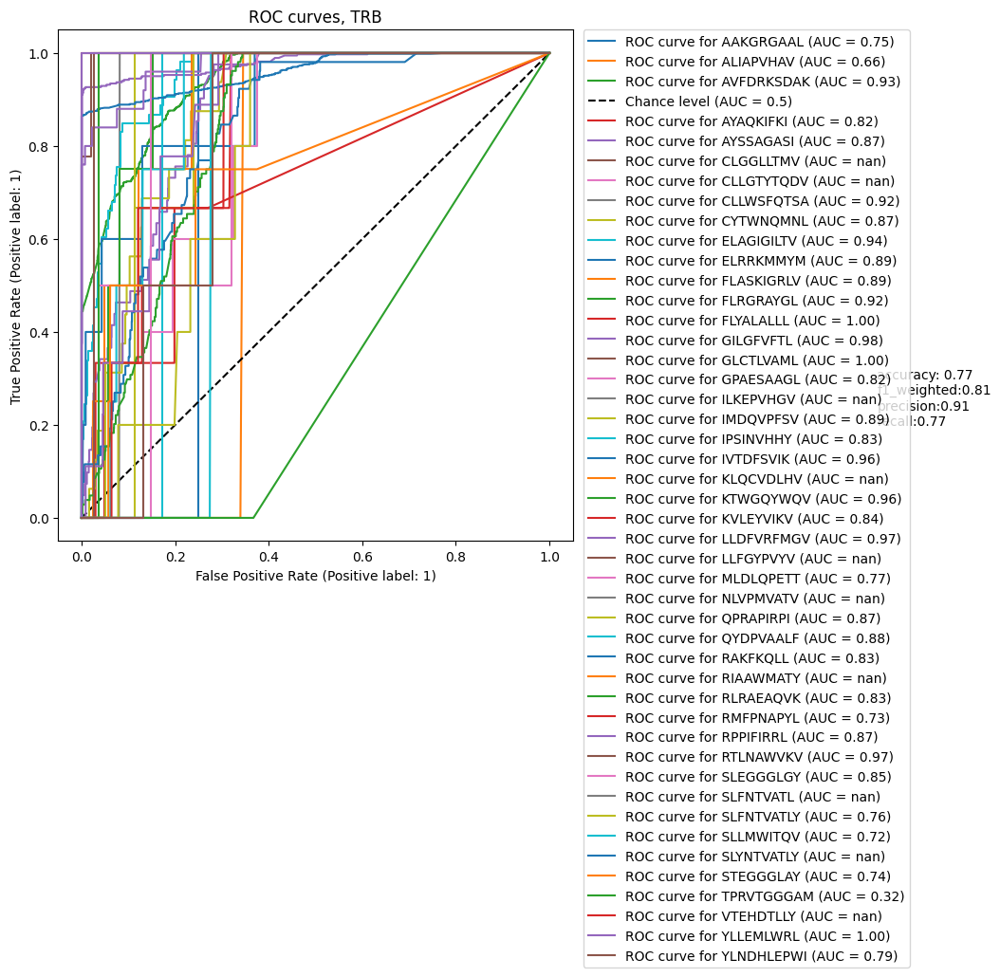

In [44]:
clf.roc_auc('TRB')

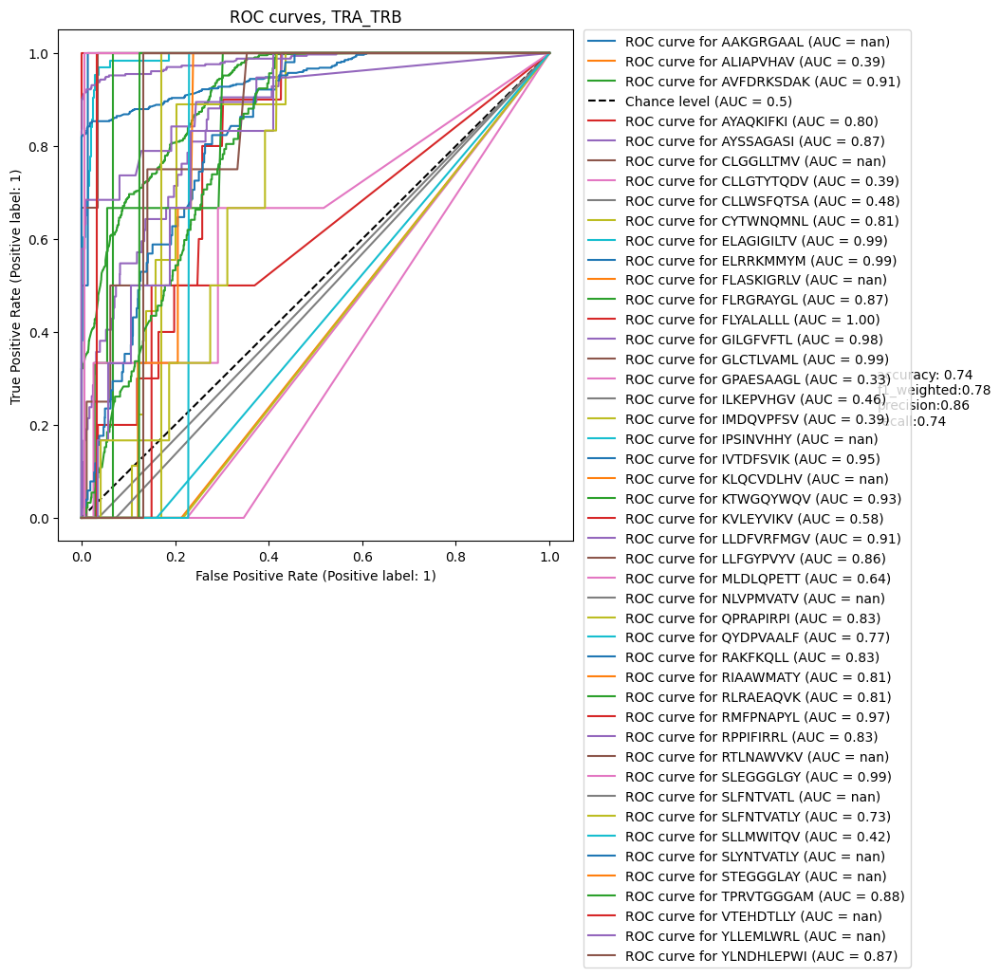

In [45]:
clf.roc_auc('TRA_TRB')

In [46]:
clf_high = TCRemb.TCRemb_clf('RF_high_100')
chain='TRA'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_high.clf(chain,tcremb, label_high,test_size=0.15)

Train accuracy: 0.9298758217677137
Test accuracy: 0.735224586288416
macro: {'f1': 0.39877679618985673, 'precision': 0.4065333529345031, 'recall': 0.4474379734680854}
weighted: {'f1': 0.770360252831816, 'precision': 0.8532048751332991, 'recall': 0.735224586288416}


In [47]:
chain='TRB'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_high.clf(chain,tcremb, label_high,test_size=0.15)

Train accuracy: 0.9425862068965517
Test accuracy: 0.77294921875
macro: {'f1': 0.3786238233947508, 'precision': 0.3624035766142225, 'recall': 0.5537936109742833}
weighted: {'f1': 0.8160912107230414, 'precision': 0.9131936272446869, 'recall': 0.77294921875}


In [49]:
chain='TRA_TRB'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_high.clf(chain,tcremb_paired, label_high,test_size=0.15)

Train accuracy: 0.9448616176786098
Test accuracy: 0.7399756986634265
macro: {'f1': 0.38679382517730543, 'precision': 0.38500396935203085, 'recall': 0.47316211516746276}
weighted: {'f1': 0.7780699231287204, 'precision': 0.8765677171534572, 'recall': 0.7399756986634265}


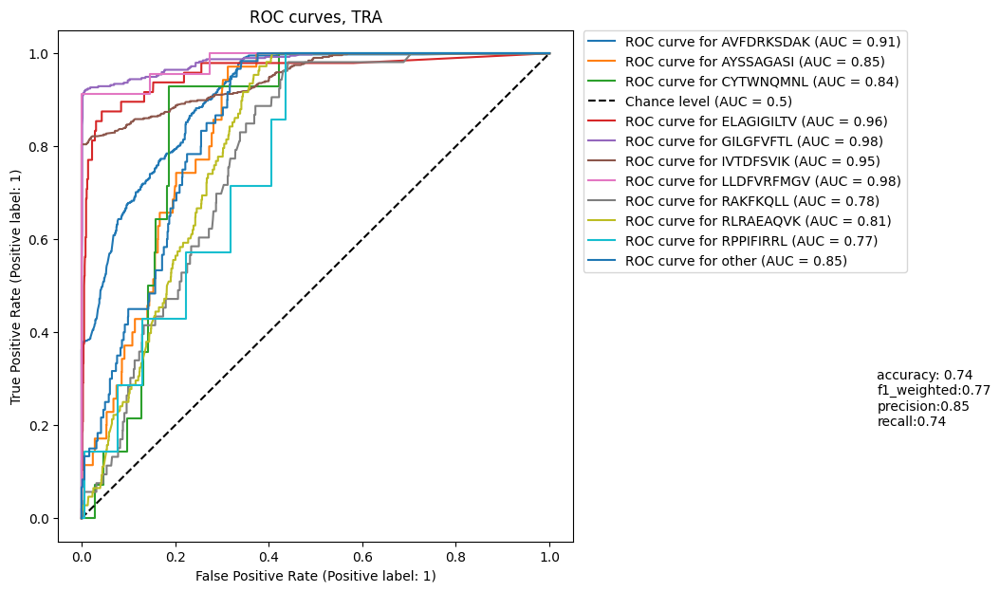

In [50]:
clf_high.roc_auc('TRA')

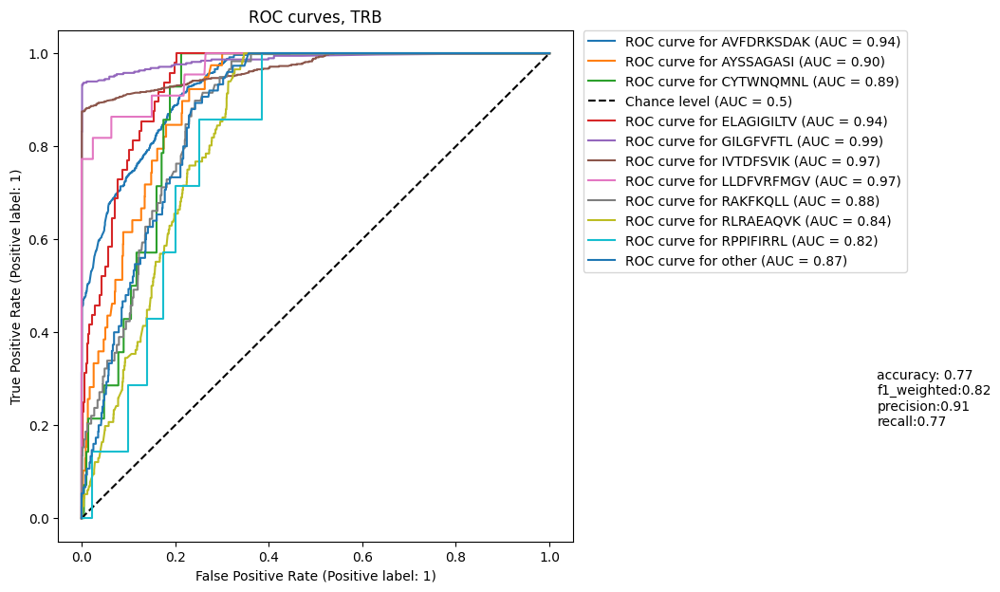

In [51]:
clf_high.roc_auc('TRB')

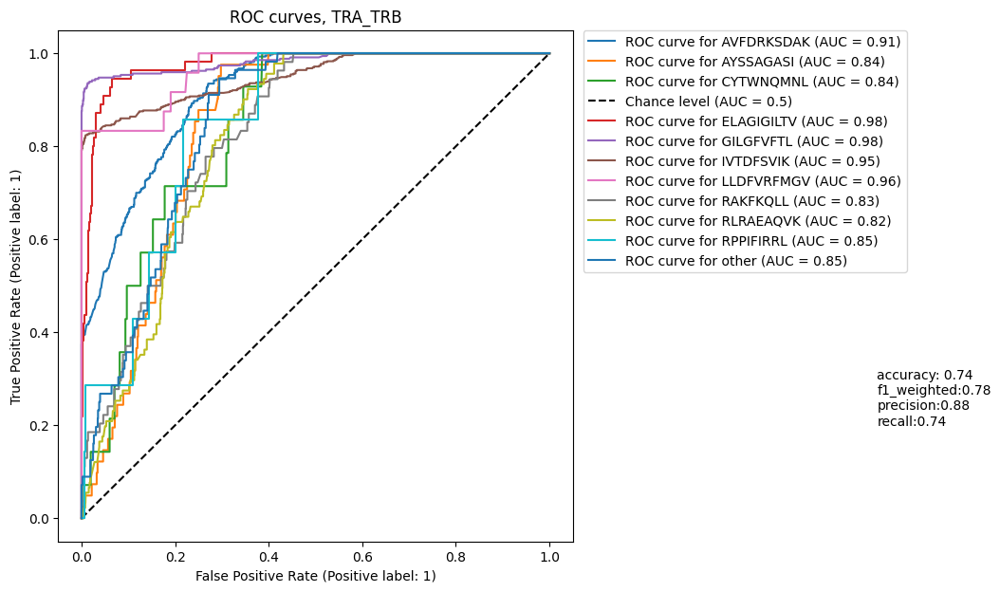

In [52]:
clf_high.roc_auc('TRA_TRB')

In [ ]:
model_name = 'RF'
clsf_dict[model_name]= {'model':{},'roc_auc':{}}
#tcremb['clsf_labels'][model_name]={}

In [ ]:
def clf_model(model, label_np, proc_df, annotation_id_column, chain, test_size = 0.3 ,show_legend=True):
    
    y_train, y_test,X_train, X_test  = train_test_split(label_np, proc_df.drop(annotation_id_column, axis=1, errors = 'ignore') ,test_size=test_size)
    model.fit(X_train, y_train)
    pred = model.predict(X_test)   
    print(f'Train accuracy: {model.score(X_train,y_train)}')
    print(f'Test accuracy: {model.score(X_test,y_test)}')
    
    roc_auc_df = TCRemb_code2.roc_auc(model, pred, y_test, X_test, chain, show_legend)
    
    return model, roc_auc_df.sort_values('roc_auc',ascending=False),y_train, y_test,X_train, X_test

Train accuracy: 0.9288402728769701
Test accuracy: 0.7510976948408342
good prediction: 36 classes with roc auc >= 0.6
failed: 11 classes with roc auc < 0.6


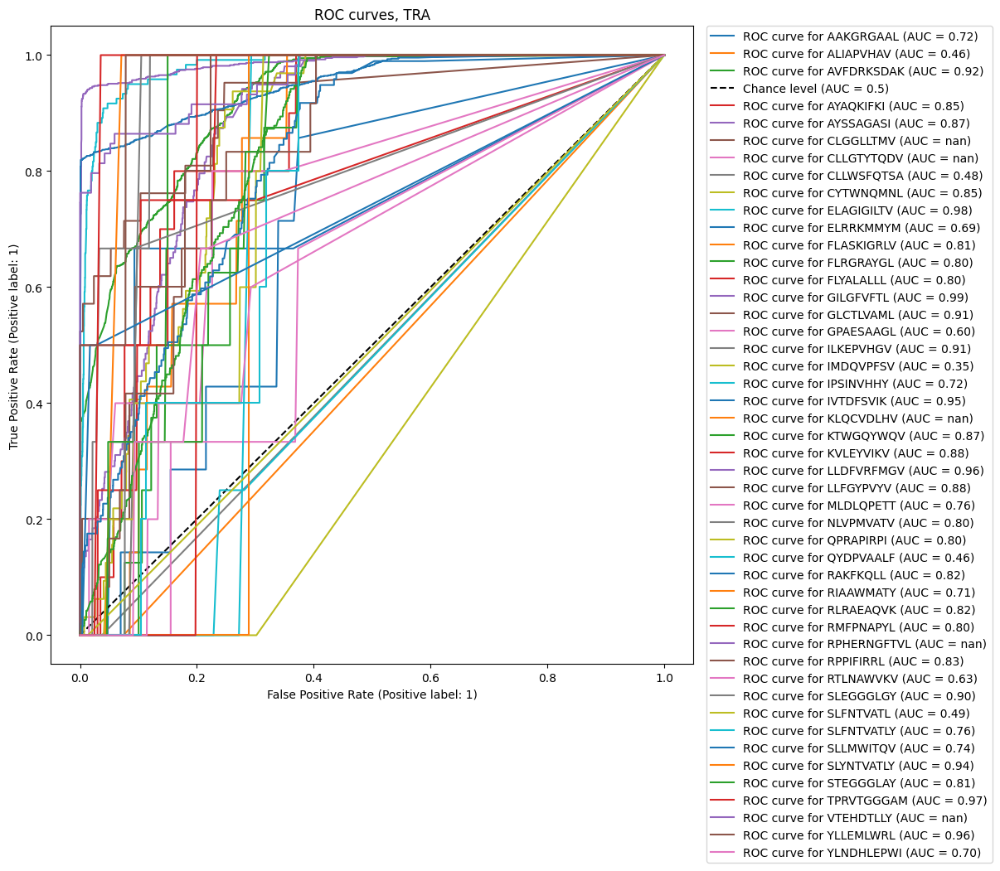

In [ ]:
chain = 'TRA'
max_depth = 20
y_data = tcremb['annot'][chain][label]
X_data = tcremb['pca'][chain]#.drop(annotation_id, axis=1, errors = 'ignore')

model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clsf_dict[model_name]['model'][chain], clsf_dict[model_name]['roc_auc'][chain],y_train, y_test,X_train, X_test = clf_model(model,y_data, X_data , annotation_id, chain, 0.3)


In [ ]:
clonotypes_in_train = {}

In [100]:

t = pd.merge(tcremb['annot'][chain],y_test,left_index=True, right_index=True)
t_train = pd.merge(tcremb['annot'][chain],y_train,left_index=True, right_index=True)
t['flag'] = t[clonotype_id_column].apply(lambda x: 1 if x in t_train[clonotype_id_column] else 0)
clonotypes_in_train[chain]=len(t[t['flag']==1])/len(t)

Train accuracy: 0.9427707998866749
Test accuracy: 0.7781449658515092
good prediction: 37 classes with roc auc >= 0.6
failed: 10 classes with roc auc < 0.6


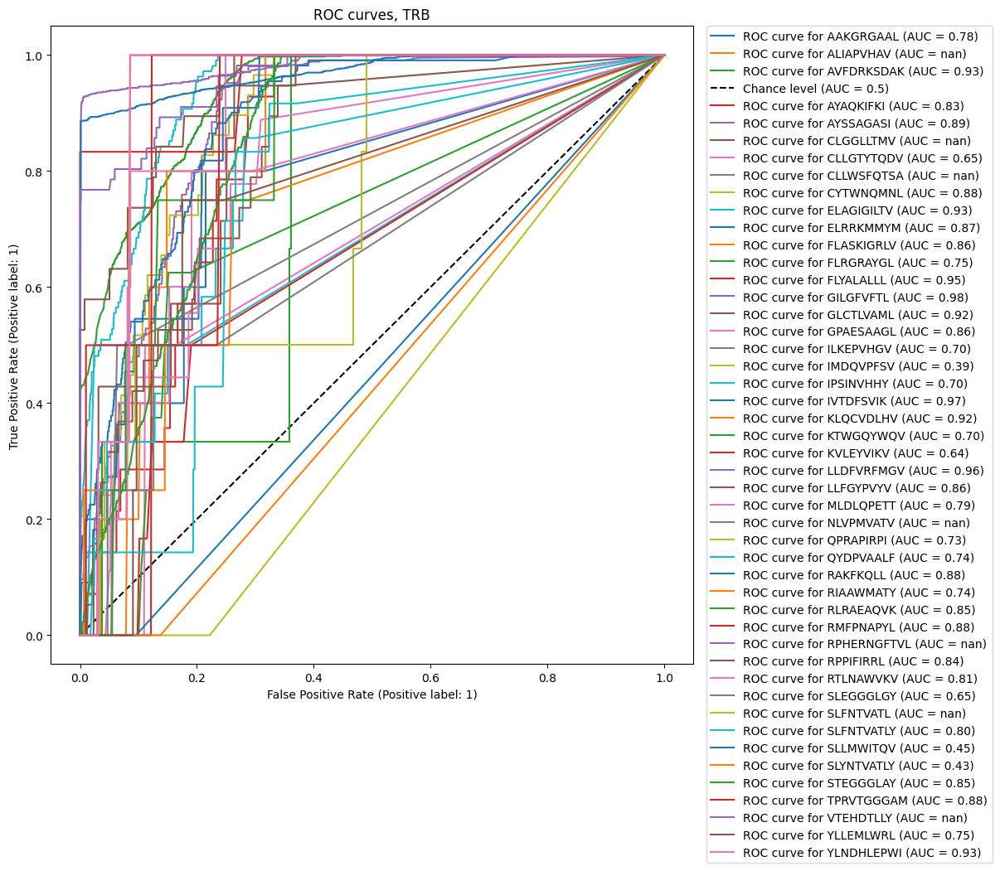

In [101]:
chain = 'TRB'
max_depth = 20
y_data = tcremb['annot'][chain][label]
X_data = tcremb['pca'][chain]#.drop(annotation_id, axis=1, errors = 'ignore')

model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clsf_dict[model_name]['model'][chain], clsf_dict[model_name]['roc_auc'][chain],y_train, y_test,X_train, X_test = clf_model(model,y_data, X_data , annotation_id, chain, 0.3)


In [102]:
t = pd.merge(tcremb['annot'][chain],y_test,left_index=True, right_index=True)
t_train = pd.merge(tcremb['annot'][chain],y_train,left_index=True, right_index=True)
t['flag'] = t[clonotype_id_column].apply(lambda x: 1 if x in t_train[clonotype_id_column] else 0)
clonotypes_in_train[chain]=len(t[t['flag']==1])/len(t)

Text(0.5, 1.0, 'Fraction of barcodes with clonotypes present in train set, 10x donor1')

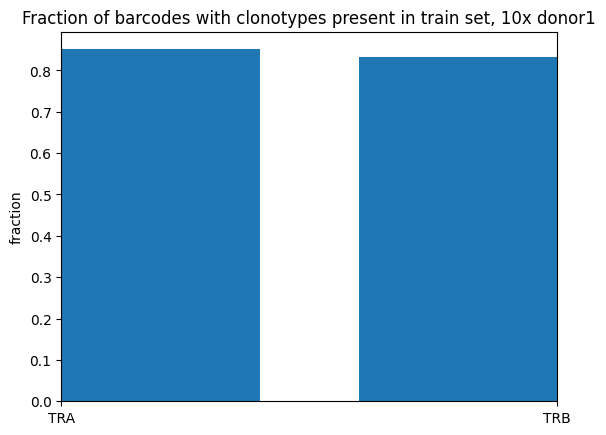

In [103]:
fig, ax = plt.subplots()
ax.bar(list(clonotypes_in_train.keys()),list(clonotypes_in_train.values()))
ax.set_xlim([0, 1])
ax.set_ylabel('fraction')
ax.set_title(f'Fraction of barcodes with clonotypes present in train set, 10x {donor}')

## Fig

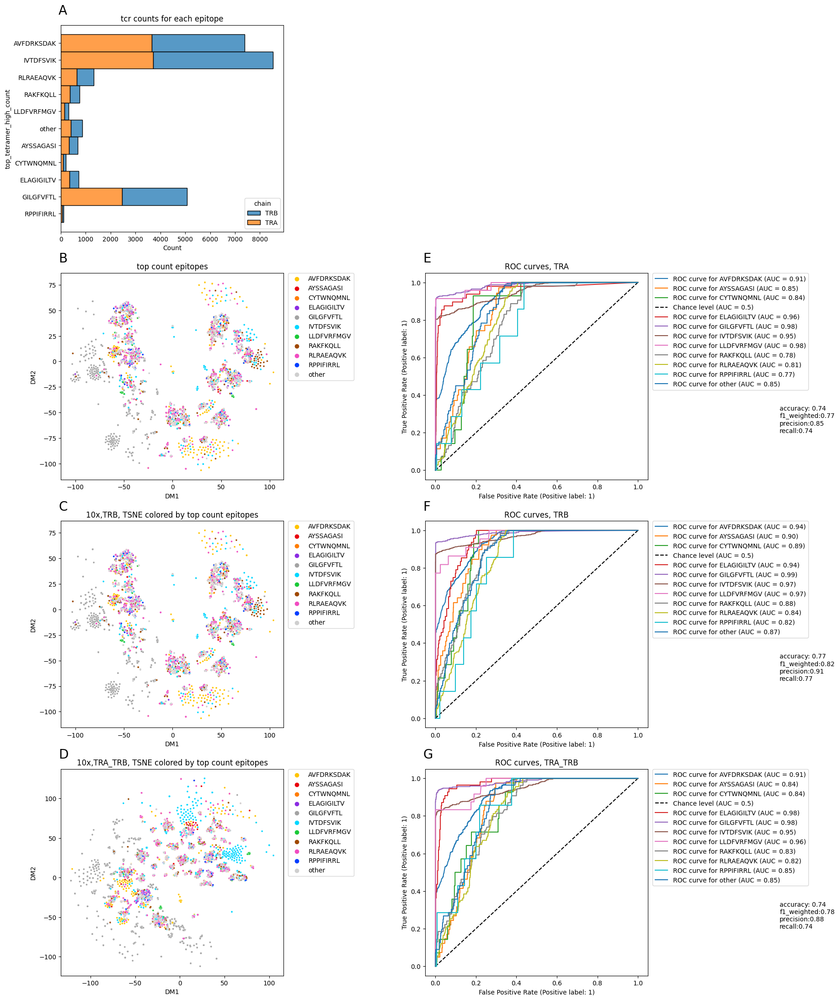

In [68]:

custom_palette = ml_utils.make_custom_palette(label_high_count)

fig = plt.figure(figsize=(20,27))

delta_x=-0.01
delta_y=1.1
font_size=20


gs00 = fig.add_gridspec(4, 6)

ax1 = fig.add_subplot(gs00[0, :2])
ax2 = fig.add_subplot(gs00[1, :2])
ax3 = fig.add_subplot(gs00[2, :2])
ax4 = fig.add_subplot(gs00[3, :2])
ax5 = fig.add_subplot(gs00[1, 3:5])
ax6 = fig.add_subplot(gs00[2, 3:5])
ax7 = fig.add_subplot(gs00[3, 3:5])


sns.histplot(data = data_preped, y = label_high,hue='chain',multiple='stack', ax=ax1)

ax1.text(delta_x, delta_y , 'A',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax1.transAxes,
        size=font_size)
ax1.set_title('tcr counts for each epitope')

chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],tcremb.annot[chain]), label_high,f'10x,{chain}, TSNE colored by top count epitopes',custom_palette=custom_palette,ax=ax2)

ax2.text(delta_x, delta_y, 'B',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax2.transAxes,
        size=font_size)
ax2.set_title('top count epitopes')

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],tcremb.annot[chain]), label_high,f'10x,{chain}, TSNE colored by top count epitopes',custom_palette=custom_palette,ax=ax3)
ax3.text(delta_x, delta_y, 'C',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax3.transAxes,
        size=font_size)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tcremb_paired.tsne[chain],tcremb_paired.annot[chain]), label_high, f'10x,{chain}, TSNE colored by top count epitopes',custom_palette=custom_palette,ax=ax4)

ax4.text(delta_x, delta_y, 'D',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax4.transAxes,
        size=font_size)



clf_high.roc_auc('TRA',ax=ax5)

ax5.text(delta_x, delta_y, 'E',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax5.transAxes,
        size=font_size)


clf_high.roc_auc('TRB',ax=ax6)

ax6.text(delta_x, delta_y, 'F',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax6.transAxes,
        size=font_size)

clf_high.roc_auc('TRA_TRB',ax=ax7)

ax7.text(delta_x, delta_y, 'G',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax7.transAxes,
        size=font_size)

#plt.figtext(0.1, 0.001, 'Your-plot-metadata', ha='center', va='center')
#plt.savefig(str(outputs_path + "fig4.svg"))
#plt.savefig(str(outputs_path + "fig4.pdf"))
plt.savefig(str(outputs_path + "fig4.png"))
plt.show()





# Tetramers dimention

In [76]:
tetramers_obj = {'annot_matrix':{},'tetramers_dim':{}, 'pca':{},'tsne':{}}


In [77]:
chain='TRA'
tetramers_obj['annot_matrix'][chain]= tcremb['annot'][chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj['annot_matrix'][chain] = norm_logp(tetramers_obj['annot_matrix'][chain], 'count')
tetramers_obj['tetramers_dim'][chain] = pivot_data(tetramers_obj['annot_matrix'][chain])
tetramers_obj['annot_matrix'][chain] = tetramers_obj['annot_matrix'][chain].merge(tcremb['clstr_labels']['KMeans'][chain].merge(tcremb['annot'][chain][['annotId','barcode']]))

In [78]:
chain='TRB'
tetramers_obj['annot_matrix'][chain]= tcremb['annot'][chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj['annot_matrix'][chain] = norm_logp(tetramers_obj['annot_matrix'][chain], 'count')
tetramers_obj['tetramers_dim'][chain] = pivot_data(tetramers_obj['annot_matrix'][chain])
tetramers_obj['annot_matrix'][chain] = tetramers_obj['annot_matrix'][chain].merge(tcremb['clstr_labels']['KMeans'][chain].merge(tcremb['annot'][chain][['annotId','barcode']]))

In [79]:
chain='TRA_TRB'
tetramers_obj['annot_matrix'][chain]= tcremb['annot'][chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj['annot_matrix'][chain] = norm_logp(tetramers_obj['annot_matrix'][chain], 'count')
tetramers_obj['tetramers_dim'][chain] = pivot_data(tetramers_obj['annot_matrix'][chain])
tetramers_obj['annot_matrix'][chain] = tetramers_obj['annot_matrix'][chain].merge(tcremb['clstr_labels']['KMeans'][chain].merge(tcremb['annot'][chain][['annotId','barcode']]))

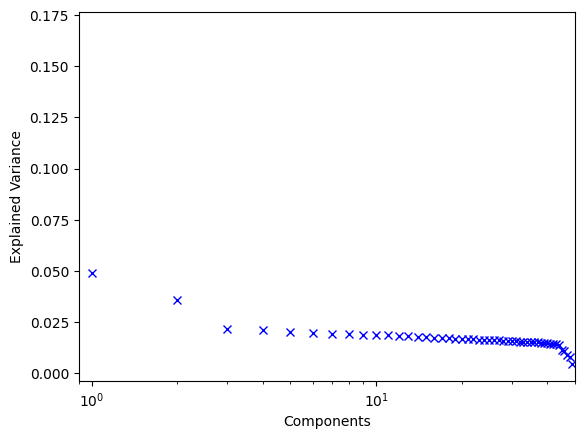

In [80]:
n = 50
chain = 'TRA'
tetramers_obj['pca'][chain] = TCRemb_code2.pca_proc(tetramers_obj['tetramers_dim'][chain].reset_index(), 'barcode',n)

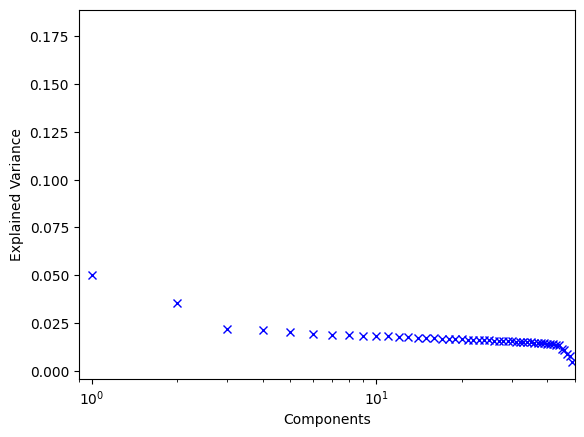

In [81]:
n = 50
chain = 'TRB'
tetramers_obj['pca'][chain] = TCRemb_code2.pca_proc(tetramers_obj['tetramers_dim'][chain].reset_index(), 'barcode',n)

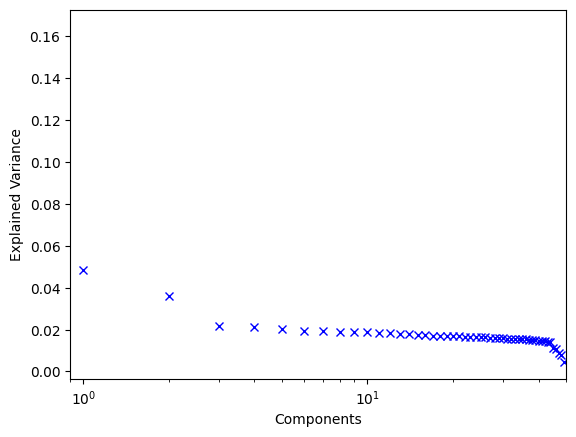

In [82]:
n = 50
chain = 'TRA_TRB'
tetramers_obj['pca'][chain] = TCRemb_code2.pca_proc(tetramers_obj['tetramers_dim'][chain].reset_index(), 'barcode',n)

In [83]:
init = 'pca'
random_state = 4
perplexity = 15

In [84]:
chain = 'TRA'
tetramers_obj['tsne'][chain] = TCRemb_code2.tsne_proc(tetramers_obj['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
tetramers_obj['tsne'][chain].shape

(34511, 3)

In [85]:
chain = 'TRB'
tetramers_obj['tsne'][chain] = TCRemb_code2.tsne_proc(tetramers_obj['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
tetramers_obj['tsne'][chain].shape

(41104, 3)

In [86]:
chain = 'TRA_TRB'
tetramers_obj['tsne'][chain] = TCRemb_code2.tsne_proc(tetramers_obj['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
tetramers_obj['tsne'][chain].shape

(32674, 3)

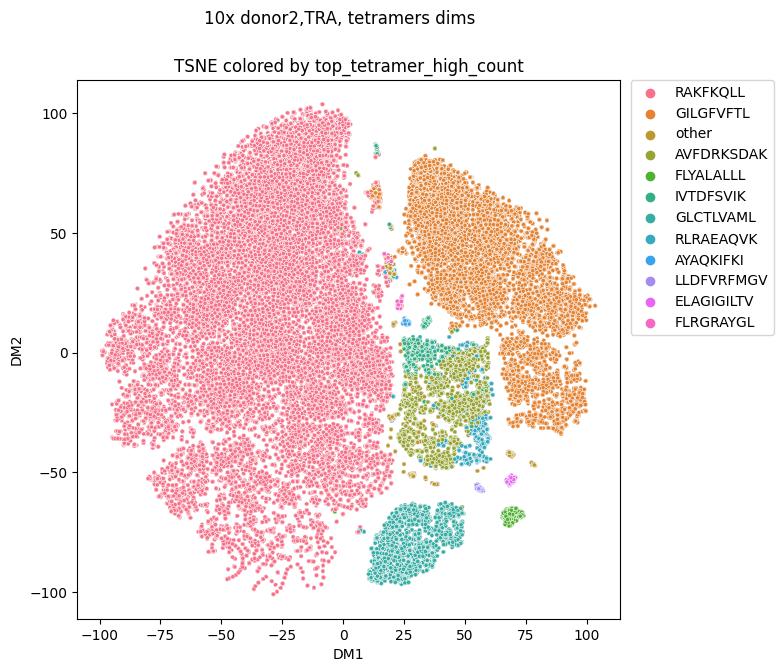

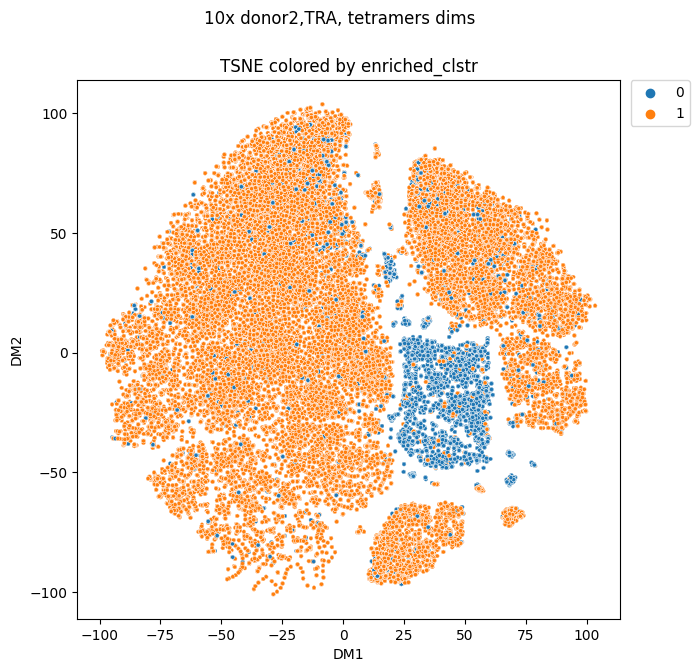

In [87]:
chain = 'TRA'
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), label_high, f'10x {donor},{chain}, tetramers dims', f'TSNE colored by {label_high}', True)
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), 'enriched_clstr', f'10x {donor},{chain}, tetramers dims', f'TSNE colored by enriched_clstr', True)



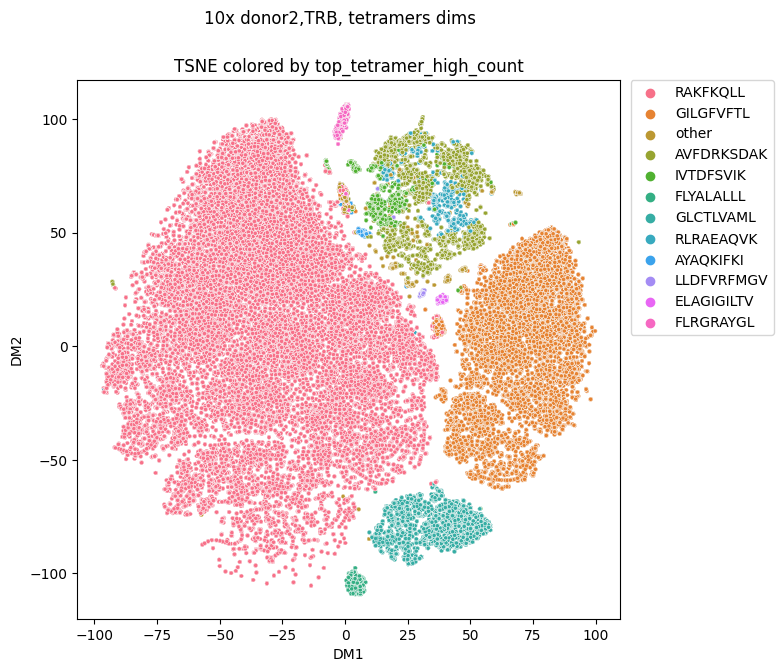

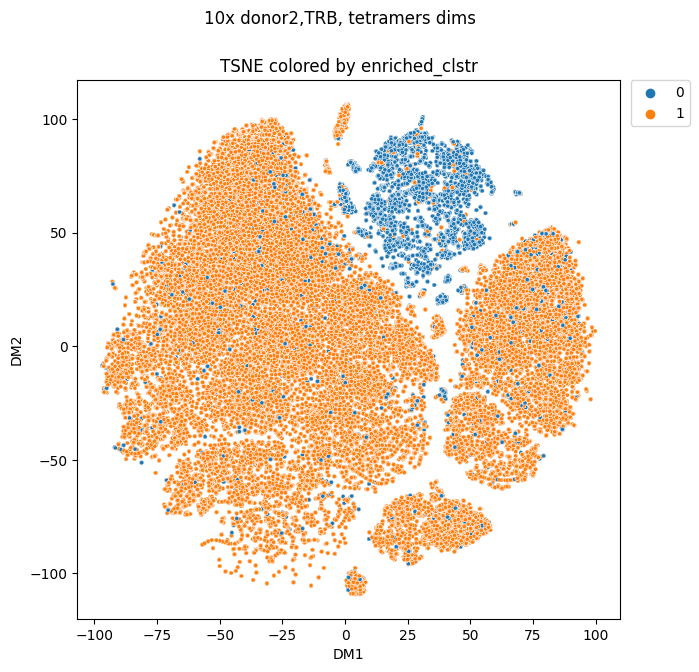

In [88]:
chain = 'TRB'
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), label_high, f'10x {donor},{chain}, tetramers dims', f'TSNE colored by {label_high}', True)
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), 'enriched_clstr', f'10x {donor},{chain}, tetramers dims', f'TSNE colored by enriched_clstr', True)


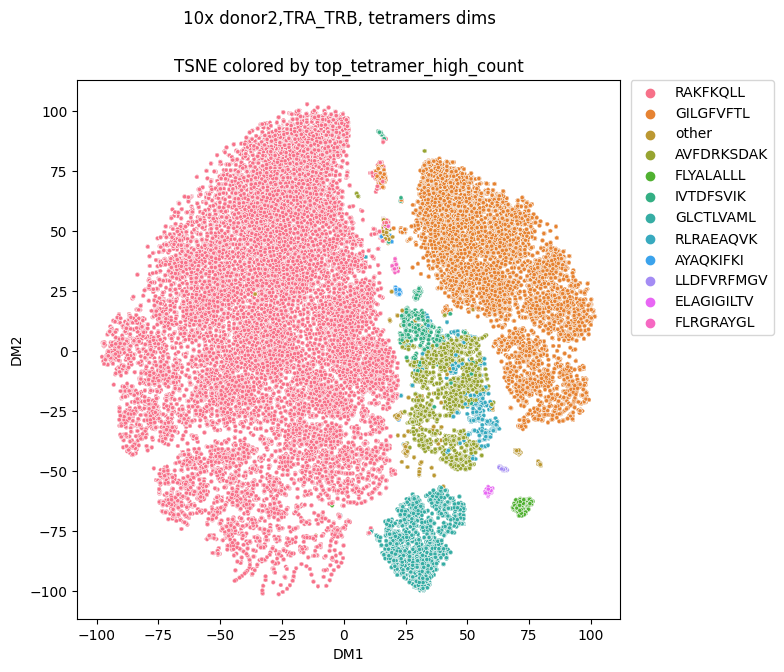

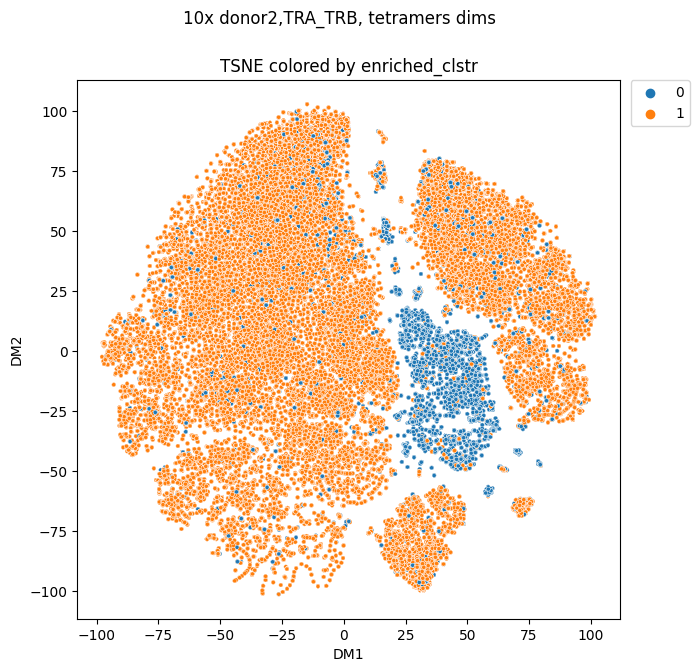

In [89]:
chain = 'TRA_TRB'
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), label_high, f'10x {donor},{chain}, tetramers dims', f'TSNE colored by {label_high}', True)
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), 'enriched_clstr', f'10x {donor},{chain}, tetramers dims', f'TSNE colored by enriched_clstr', True)


In [ ]:
chain = 'TRA'
t = tcremb['annot'][chain].copy()
t = t.drop_duplicates([clonotype_id_column,label])
t['top_tetramers_n']=t.groupby(clonotype_id_column)[label].transform('count')
mixed_clones= list(t[t['top_tetramers_n']>1][clonotype_id_column].drop_duplicates())
tetramers_obj['annot_matrix'][chain]['cross'] = tetramers_obj['annot_matrix'][chain].apply(lambda x: 1 if x[clonotype_id_column] in mixed_clones else 0,axis=1)

In [ ]:
chain = 'TRB'
t = tcremb['annot'][chain].copy()
t = t.drop_duplicates([clonotype_id_column,label])
t['top_tetramers_n']=t.groupby(clonotype_id_column)[label].transform('count')
mixed_clones= list(t[t['top_tetramers_n']>1][clonotype_id_column].drop_duplicates())
tetramers_obj['annot_matrix'][chain]['cross'] = tetramers_obj['annot_matrix'][chain].apply(lambda x: 1 if x[clonotype_id_column] in mixed_clones else 0,axis=1)

In [ ]:
tetramers_obj['annot_matrix']['TRB']['cross'] = tetramers_obj['annot_matrix']['TRB'].apply(lambda x: 1 if x[clonotype_id_column] in trb_mixed_cloned else 0,axis=1)

0         1
1         1
2         1
3         1
4         1
         ..
143888    1
143889    1
143890    1
143891    1
143892    1
Length: 97246, dtype: int64

In [ ]:
chain = 'TRB'
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), label_high, f'10x {donor},{chain}, tetramers dims', f'TSNE colored by {label_high}', True)
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), 'enriched_clstr', f'10x {donor},{chain}, tetramers dims', f'TSNE colored by enriched_clstr', True)


In [228]:
t = tcremb['clstr_labels']['KMeans'][chain].merge(tcremb['annot'][chain])

In [233]:
t[t['enriched_clstr']==1].drop_duplicates(label)

,cluster,annotId,clstr_top_tetramer,total_cluster,total_group,count_mached,fraction_mached,fraction_mached_exp,p_value,enriched_clstr,...,cdr3_nt,reads,umis,raw_clonotype_id,raw_consensus_id,top_tetramer,count,data_id,top_tetramer_high_count,cloneId
5,76,5,FLYALALLL,17,26,14,0.823529,0.002141,2.867242e-35,1,...,TGTGCTACGGAGGGGAATTCAGGATACAGCACCCTCACCTTT,92096,32,clonotype271,clonotype271_consensus_2,FLYALALLL,21,37517,other,5374
10,9,11,AVFDRKSDAK,1142,3130,1138,0.996497,0.257698,0.000000e+00,1,...,TGTGCTGTGGGTGACAACTTCAACAAATTTTACTTT,35120,31,clonotype2,clonotype2_consensus_1,AVFDRKSDAK,328,48137,AVFDRKSDAK,5737
11,49,13,AVFDRKSDAK,4,3130,3,0.750000,0.257698,5.522294e-02,1,...,TGCATCCTGAGAGACAGAGATGACAAGATCATCTTT,49871,30,clonotype321,clonotype321_consensus_2,IVTDFSVIK,5,24811,IVTDFSVIK,7094
19,109,21,LLDFVRFMGV,72,166,70,0.972222,0.013667,7.816534e-128,1,...,TGTGCTACCTTTAACAATGCAGGCAACATGCTCACCTTT,98152,26,clonotype15354,clonotype15354_consensus_2,AYSSAGASI,8,25762,AYSSAGASI,5385
33,50,36,GILGFVFTL,18,2730,18,1.000000,0.224765,2.143526e-12,1,...,TGTGCTGCGAGACCCTCTTTT,52438,22,clonotype165,clonotype165_consensus_1,GILGFVFTL,186,36066,GILGFVFTL,169
103,109,116,LLDFVRFMGV,72,166,70,0.972222,0.013667,7.816534e-128,1,...,TGTGCTGCGATAAATAATGCAGGCAACATGCTCACCTTT,45274,16,clonotype49,clonotype49_consensus_1,LLDFVRFMGV,141,22308,LLDFVRFMGV,61
163,842,184,ELAGIGILTV,7,371,6,0.857143,0.030545,5.536303e-09,1,...,TGTGCCGTGAACATCGGGAAATTAACCTTT,50725,14,clonotype13505,clonotype13505_consensus_1,ELAGIGILTV,27,22515,ELAGIGILTV,6063
247,219,274,AVFDRKSDAK,11,3130,9,0.818182,0.257698,1.627667e-04,1,...,TGTGCTCTGAGTCTCAAATACAACTTCAACAAATTTTACTTT,31693,13,clonotype61,clonotype61_consensus_2,RLRAEAQVK,5,11355,RLRAEAQVK,1477
254,2001,281,ELAGIGILTV,9,371,7,0.777778,0.030545,8.459829e-10,1,...,TGTGCCGTGAAAGTCGACCAGTTCTATTTT,29441,13,clonotype26246,clonotype26246_consensus_1,SLFNTVATLY,10,45950,other,5937
317,1238,346,GLCTLVAML,3,45,3,1.000000,0.003705,5.085547e-08,1,...,TGTGCAGAGTTGAAGGAAAAGCTGATTTTT,38340,12,clonotype730,clonotype730_consensus_1,GLCTLVAML,35,49635,other,526


In [241]:
t[(t['enriched_clstr']==0)&(t['count']>1000)]

,cluster,annotId,clstr_top_tetramer,total_cluster,total_group,count_mached,fraction_mached,fraction_mached_exp,p_value,enriched_clstr,...,cdr3_nt,reads,umis,raw_clonotype_id,raw_consensus_id,top_tetramer,count,data_id,top_tetramer_high_count,cloneId
3972,26,4394,IVTDFSVIK,4,3815,1,0.25,0.314095,0.778662,0,...,TGTGCAGCAAGCGCGAGTAGAGATGACAAGATCATCTTT,7696,5,clonotype30325,clonotype30325_consensus_2,AAKGRGAAL,76112470,53171,other,206


In [242]:
statistics.median(t[t['enriched_clstr']==0]['count'])

9

In [243]:
statistics.median(t[t['enriched_clstr']==1]['count'])

181

In [252]:
t

,cluster,annotId,clstr_top_tetramer,total_cluster,total_group,count_mached,fraction_mached,fraction_mached_exp,p_value,enriched_clstr,...,cdr3_nt,reads,umis,raw_clonotype_id,raw_consensus_id,top_tetramer,count,data_id,top_tetramer_high_count,cloneId
0,1911,0,AVFDRKSDAK,1,3130,1,1.000000,0.257698,2.576980e-01,0,...,TGTGCTGTGACCGACAGCTGGGGGAAATTGCAGTTT,108619,53,clonotype18308,clonotype18308_consensus_2,AVFDRKSDAK,11,31441,AVFDRKSDAK,6741
1,595,1,AVFDRKSDAK,2,3130,2,1.000000,0.257698,6.640826e-02,0,...,TGTGCTTATAGGAGCGCGAAGGATAGCAGCTATAAATTGATCTTC,82579,34,clonotype4925,clonotype4925_consensus_1,AVFDRKSDAK,9,6587,AVFDRKSDAK,6939
2,81,2,AVFDRKSDAK,45,3130,33,0.733333,0.257698,3.375186e-11,0,...,TGTGCTGTGGACCCTATGGACACGGGCAGGAGAGCACTTACTTTT,59875,34,clonotype13,clonotype13_consensus_1,AVFDRKSDAK,18,39202,AVFDRKSDAK,5615
3,13,3,AVFDRKSDAK,112,3130,59,0.526786,0.257698,1.188737e-09,0,...,TGTGCTGTGCATGGCTATGGTCAGAATTTTGTCTTT,122761,33,clonotype6,clonotype6_consensus_1,AVFDRKSDAK,13,19797,AVFDRKSDAK,5830
4,1325,4,AVFDRKSDAK,1,3130,1,1.000000,0.257698,2.576980e-01,0,...,TGTGCTACGGGTGATAACTATGGTCAGAATTTTGTCTTT,50043,33,clonotype4041,clonotype4041_consensus_1,AVFDRKSDAK,15,4874,AVFDRKSDAK,5391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12141,0,13178,IVTDFSVIK,2674,3815,2672,0.999252,0.314095,0.000000e+00,1,...,TGTGCTGGTCACACCGGTAACCAGTTCTATTTT,119,1,NaN,NaN,IVTDFSVIK,103,53634,IVTDFSVIK,903
12142,0,13179,IVTDFSVIK,2674,3815,2672,0.999252,0.314095,0.000000e+00,1,...,TGTGCTGGTCACACCGGTAACCAGTTCTATTTT,108,1,clonotype1,clonotype1_consensus_1,IVTDFSVIK,68,30089,IVTDFSVIK,903
12143,0,13180,IVTDFSVIK,2674,3815,2672,0.999252,0.314095,0.000000e+00,1,...,TGTGCTGGTCACACCGGTAACCAGTTCTATTTT,106,1,NaN,NaN,IVTDFSVIK,161,54253,IVTDFSVIK,903
12144,0,13181,IVTDFSVIK,2674,3815,2672,0.999252,0.314095,0.000000e+00,1,...,TGTGCTGGTCACACCGGTAACCAGTTCTATTTT,101,1,NaN,NaN,IVTDFSVIK,242,55660,IVTDFSVIK,903


In [247]:
t['enriched_clstr'] = t['enriched_clstr'].astype(str)

<Axes: >

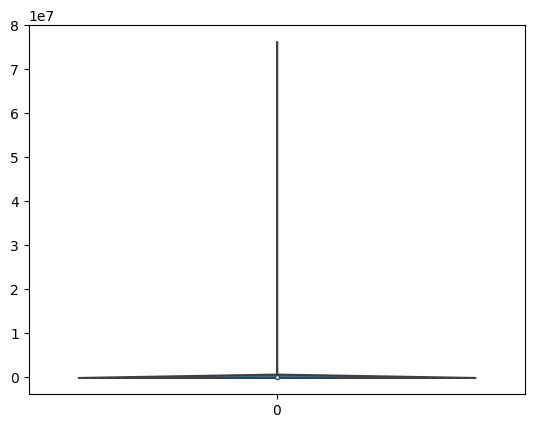

In [256]:
sns.violinplot(t['count'])